In [ ]:
! pip install torcheval

In [ ]:
import gdown
import zipfile

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torch import optim
from PIL import Image
from torchvision import transforms
import os
import matplotlib.pyplot as plt
import numpy as np
from torcheval.metrics.functional import peak_signal_noise_ratio
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(66)

In [ ]:
id = '1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3'

def download_data(id):
    url = f'https://drive.google.com/uc?id={id}'
    gdown.download(url, quiet=False)

download_data(id)

Downloading...
From (original): https://drive.google.com/uc?id=1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3
From (redirected): https://drive.google.com/uc?id=1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3&confirm=t&uuid=6c430af0-23a2-472c-9592-6a707aff0359
To: /content/Khoa_LHR_image.zip
100%|██████████| 89.0M/89.0M [00:02<00:00, 34.9MB/s]


In [ ]:
with zipfile.ZipFile('Khoa_LHR_image.zip', 'r') as zip_ref:
    zip_ref.extractall()

In [ ]:
LHR_TRAIN_DATA_PATH = './Khoa_LHR_image/train'
LHR_VAL_DATA_PATH = './Khoa_LHR_image/val'
BATCH_SIZE = 8
LOW_IMG_HEIGHT = 64
LOW_IMG_WIDTH = 64

In [ ]:
class FirstFeatureNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FirstFeatureNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)


class ConvBlockNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlockNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class EncoderNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels) -> None:
        super(EncoderNoSkip, self).__init__()
        self.encoder = nn.Sequential(
            nn.MaxPool2d(2),
            ConvBlockNoSkip(in_channels, out_channels)
        )

    def forward(self, x):
        x = self.encoder(x)
        return x


class DecoderNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DecoderNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(in_channels, out_channels*2, 1, 1, 0, bias=False),
            nn.BatchNorm2d(out_channels*2),
            nn.LeakyReLU(),
        )
        self.conv_block = ConvBlockNoSkip(out_channels*2, out_channels)

    def forward(self, x):
        x = self.conv(x)
        x = self.conv_block(x)
        return x


class FinalOutputNoSkip(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FinalOutputNoSkip, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.conv(x)


class SR_Unet_NoSkip(nn.Module):
    def __init__(
            self, n_channels=3, n_classes=3
    ):
        super(SR_Unet_NoSkip, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes
        self.resize_fnc = transforms.Resize((LOW_IMG_HEIGHT*4, LOW_IMG_HEIGHT*4),
                                             antialias=True)
        self.in_conv1 = FirstFeatureNoSkip(n_channels, 64)
        self.in_conv2 = ConvBlockNoSkip(64, 64)

        self.enc_1 = EncoderNoSkip(64, 128)
        self.enc_2 = EncoderNoSkip(128, 256)
        self.enc_3 = EncoderNoSkip(256, 512)
        self.enc_4 = EncoderNoSkip(512, 1024)

        self.dec_1 = DecoderNoSkip(1024, 512)
        self.dec_2 = DecoderNoSkip(512, 256)
        self.dec_3 = DecoderNoSkip(256, 128)
        self.dec_4 = DecoderNoSkip(128, 64)

        self.out_conv = FinalOutputNoSkip(64, n_classes)


    def forward(self, x):
        x = self.resize_fnc(x)
        x = self.in_conv1(x)
        x = self.in_conv2(x)

        x = self.enc_1(x)
        x = self.enc_2(x)
        x = self.enc_3(x)
        x = self.enc_4(x)

        x = self.dec_1(x)
        x = self.dec_2(x)
        x = self.dec_3(x)
        x = self.dec_4(x)

        x = self.out_conv(x)
        return x

In [ ]:
unet_model = SR_Unet_NoSkip().to(device)
img = torch.ones(2, 3, 64, 64).to(device)
unet_model(img).shape

torch.Size([2, 3, 256, 256])

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, img_dir, is_train=True):
        self.resize = transforms.Resize((LOW_IMG_WIDTH, LOW_IMG_HEIGHT), antialias=True)
        self.is_train = is_train
        self.img_dir = img_dir
        self.images = os.listdir(img_dir)

    def __len__(self):
        return len(self.images)

    def normalize(self, input_image, target_image):
        input_image  = input_image*2 - 1
        target_image = target_image*2 - 1

        return input_image, target_image

    def random_jitter(self, input_image, target_image):
        if torch.rand([]) < 0.5:
            input_image = transforms.functional.hflip(input_image)
            target_image = transforms.functional.hflip(target_image)

        return input_image, target_image

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        image = np.array(Image.open(img_path).convert("RGB"))
        image = transforms.functional.to_tensor(image)

        input_image = self.resize(image).type(torch.float32)
        target_image = image.type(torch.float32)

        input_image, target_image = self.normalize(input_image, target_image)

        if self.is_train:
            input_image, target_image = self.random_jitter(input_image, target_image)

        return input_image, target_image

In [ ]:
train_dataset = ImageDataset(LHR_TRAIN_DATA_PATH, is_train=True)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

test_dataset = ImageDataset(LHR_VAL_DATA_PATH, is_train=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

Text(0.5, 1.0, 'Target')

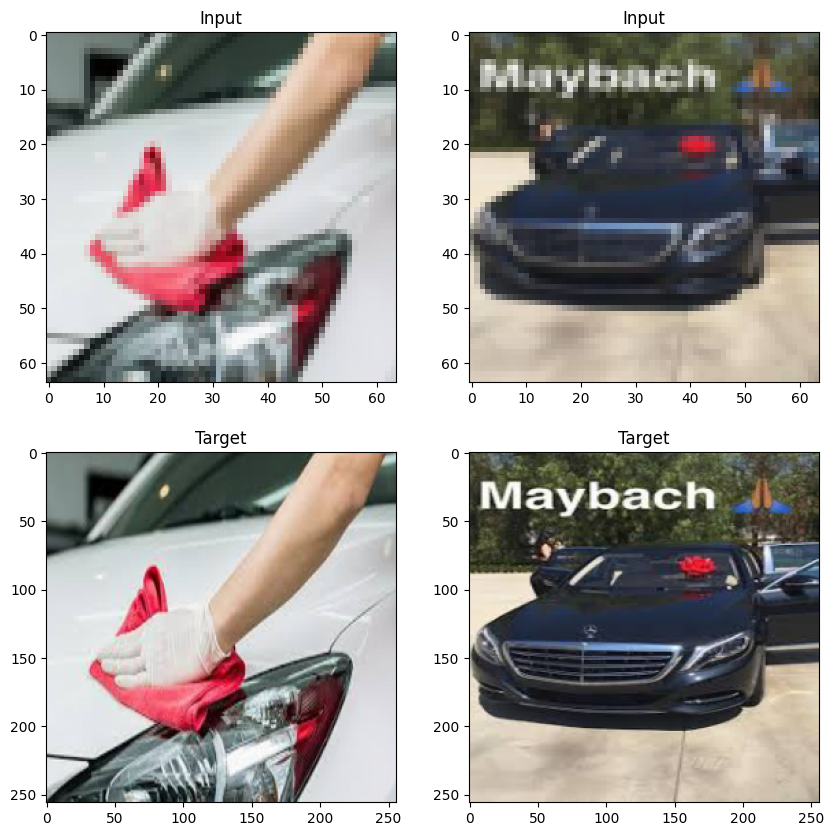

In [ ]:
in_batch, tar_batch = next(iter(train_loader))
in_batch = (in_batch + 1)/2
tar_batch = (tar_batch + 1)/2

plt.figure(figsize=(10, 10))
ax = plt.subplot(2, 2, 1)
plt.imshow(np.squeeze(in_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 3)
plt.imshow(np.squeeze(tar_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Target")
ax = plt.subplot(2, 2, 2)
plt.imshow(np.squeeze(in_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 4)
plt.imshow(np.squeeze(tar_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Target")

In [ ]:
def generate_images(model, inputs, labels):
    model.eval()
    with torch.no_grad():
        inputs, labels = inputs.to(device), labels.to(device)
        predictions = model(inputs)
    inputs, labels, predictions = inputs.cpu().numpy(), labels.cpu().numpy(), predictions.cpu().numpy()
    plt.figure(figsize=(15,20))

    display_list = [inputs[-1].transpose((1, 2, 0)), labels[-1].transpose((1, 2, 0)), predictions[-1].transpose((1, 2, 0))]
    title = ['Input', 'Real', 'Predicted']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow((display_list[i] + 1) / 2)
        plt.axis('off')
    plt.show()

In [ ]:
import time

def train_epoch(model, optimizer, criterion, train_dataloader, device, epoch=0,
                log_interval=50):
    model.train()
    total_psnr, total_count = 0, 0
    losses = []
    start_time = time.time()

    for idx, (inputs, labels) in enumerate(train_dataloader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        predictions = model(inputs)

        # compute loss
        loss = criterion(predictions, labels)
        losses.append(loss.item())

        # backward
        loss.backward()
        optimizer.step()

        total_psnr += peak_signal_noise_ratio(predictions, labels)
        total_count += 1
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            print(
                "| epoch {:3d} | {:5d}/{:5d} batches "
                "| psnr {:8.3f}".format(
                    epoch, idx, len(train_dataloader), total_psnr / total_count
                )
            )
            total_psnr, total_count = 0, 0
            start_time = time.time()

    epoch_psnr = total_psnr / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_psnr, epoch_loss

In [ ]:
def evaluate_epoch(model, criterion, valid_dataloader, device):
    model.eval()
    total_psnr, total_count = 0, 0
    losses = []

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(valid_dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            predictions = model(inputs)

            loss = criterion(predictions, labels)
            losses.append(loss.item())


            total_psnr +=  peak_signal_noise_ratio(predictions, labels)
            total_count += 1

    epoch_psnr = total_psnr / total_count
    epoch_loss = sum(losses) / len(losses)
    return epoch_psnr, epoch_loss

In [ ]:
def train(model, model_name, save_model, optimizer, criterion, train_dataloader, valid_dataloader, num_epochs, device):
    train_psnrs, train_losses = [], []
    eval_psnrs, eval_losses = [], []
    best_psnr_eval = -1000
    times = []
    for epoch in range(1, num_epochs+1):
        epoch_start_time = time.time()
        # Training
        train_psnr, train_loss = train_epoch(model, optimizer, criterion, train_dataloader, device, epoch)
        train_psnrs.append(train_psnr.cpu())
        train_losses.append(train_loss)

        # Evaluation
        eval_psnr, eval_loss = evaluate_epoch(model, criterion, valid_dataloader, device)
        eval_psnrs.append(eval_psnr.cpu())
        eval_losses.append(eval_loss)

        # Save best model
        if best_psnr_eval < eval_psnr :
            torch.save(model.state_dict(), save_model + f'/{model_name}.pt')
            inputs_t, targets_t = next(iter(valid_dataloader))
            generate_images(model, inputs_t, targets_t)
            best_psnr_eval = eval_psnr
        times.append(time.time() - epoch_start_time)
        # Print loss, psnr end epoch
        print("-" * 59)
        print(
            "| End of epoch {:3d} | Time: {:5.2f}s | Train psnr {:8.3f} | Train Loss {:8.3f} "
            "| Valid psnr {:8.3f} | Valid Loss {:8.3f} ".format(
                epoch, time.time() - epoch_start_time, train_psnr, train_loss, eval_psnr, eval_loss
            )
        )
        print("-" * 59)

    # Load best model
    model.load_state_dict(torch.load(save_model + f'/{model_name}.pt'))
    model.eval()
    metrics = {
        'train_psnr': train_psnrs,
        'train_loss': train_losses,
        'valid_psnr': eval_psnrs,
        'valid_loss': eval_losses,
        'time': times
    }
    return model, metrics

In [ ]:
import matplotlib.pyplot as plt

def predict_and_display(model, test_dataloader, device):
    model.eval()

    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(test_dataloader):
            if idx >= 10:
                break
            inputs = inputs.to(device)
            predictions = model(inputs)
            generate_images(model, inputs, labels)
            plt.show()

In [ ]:
class FirstFeature(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FirstFeature, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class Encoder(nn.Module):
    def __init__(self, in_channels, out_channels) -> None:
        super().__init__()
        self.encoder = nn.Sequential(
            nn.MaxPool2d(2),
            ConvBlock(in_channels, out_channels)
        )

    def forward(self, x):
        x = self.encoder(x)
        return x


class Decoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Decoder, self).__init__()
        self.conv = nn.Sequential(
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(),
        )
        self.conv_block = ConvBlock(in_channels, out_channels)

    def forward(self, x, skip):
        x = self.conv(x)
        x = torch.concat([x, skip], dim=1)
        x = self.conv_block(x)
        return x


class FinalOutput(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FinalOutput, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.conv(x)


class SR_Unet(nn.Module):
    def __init__(
            self, n_channels=3, n_classes=3
    ):
        super(SR_Unet, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes
        self.resize_fnc = transforms.Resize((LOW_IMG_HEIGHT*4, LOW_IMG_HEIGHT*4),
                                             antialias=True)
        self.in_conv1 = FirstFeature(n_channels, 64)
        self.in_conv2 = ConvBlock(64, 64)

        self.enc_1 = Encoder(64, 128)
        self.enc_2 = Encoder(128, 256)
        self.enc_3 = Encoder(256, 512)
        self.enc_4 = Encoder(512, 1024)

        self.dec_1 = Decoder(1024, 512)
        self.dec_2 = Decoder(512, 256)
        self.dec_3 = Decoder(256, 128)
        self.dec_4 = Decoder(128, 64)

        self.out_conv = FinalOutput(64, n_classes)


    def forward(self, x):
        x = self.resize_fnc(x)
        x = self.in_conv1(x)
        x1 = self.in_conv2(x)

        x2 = self.enc_1(x1)
        x3 = self.enc_2(x2)
        x4 = self.enc_3(x3)
        x5 = self.enc_4(x4)

        x = self.dec_1(x5, x4)
        x = self.dec_2(x, x3)
        x = self.dec_3(x, x2)
        x = self.dec_4(x, x1)

        x = self.out_conv(x)
        return x

In [ ]:
unet_model = SR_Unet().to(device)
img = torch.ones(2, 3, 64, 64).to(device)
unet_model(img).shape

torch.Size([2, 3, 256, 256])

Unet No Skip Connection

| epoch   1 |    50/   86 batches | psnr   14.941


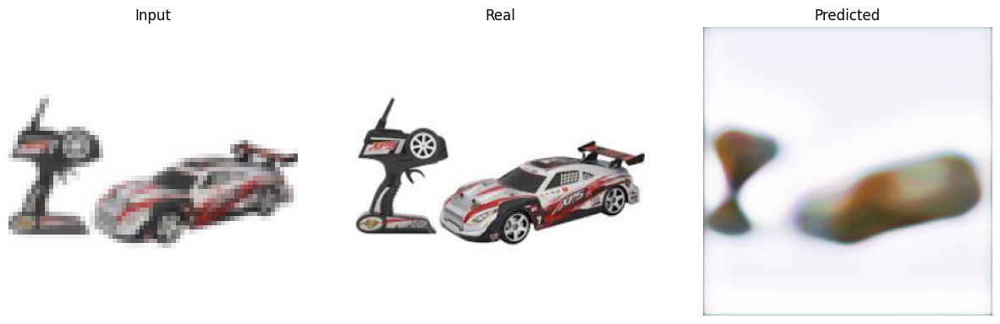

-----------------------------------------------------------
| End of epoch   1 | Time: 53.54s | Train psnr   16.162 | Train Loss    0.248 | Valid psnr   16.396 | Valid Loss    0.207 
-----------------------------------------------------------
| epoch   2 |    50/   86 batches | psnr   16.088


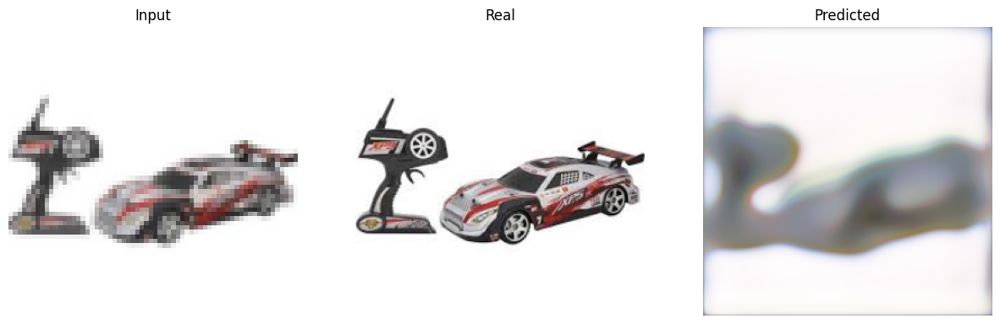

-----------------------------------------------------------
| End of epoch   2 | Time: 56.22s | Train psnr   16.281 | Train Loss    0.220 | Valid psnr   16.953 | Valid Loss    0.198 
-----------------------------------------------------------
| epoch   3 |    50/   86 batches | psnr   16.758


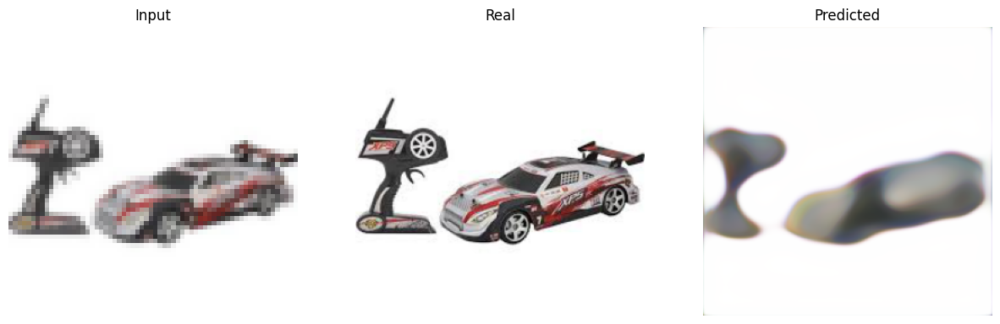

-----------------------------------------------------------
| End of epoch   3 | Time: 56.34s | Train psnr   16.857 | Train Loss    0.200 | Valid psnr   17.513 | Valid Loss    0.177 
-----------------------------------------------------------
| epoch   4 |    50/   86 batches | psnr   17.397
-----------------------------------------------------------
| End of epoch   4 | Time: 55.12s | Train psnr   17.096 | Train Loss    0.188 | Valid psnr   17.352 | Valid Loss    0.183 
-----------------------------------------------------------
| epoch   5 |    50/   86 batches | psnr   17.786


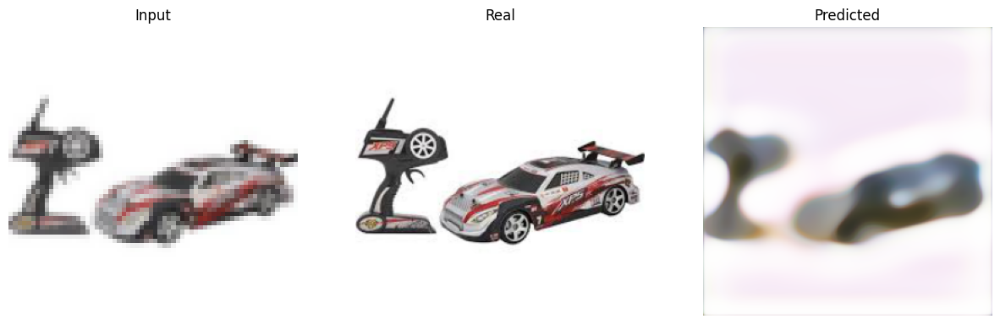

-----------------------------------------------------------
| End of epoch   5 | Time: 55.77s | Train psnr   17.720 | Train Loss    0.175 | Valid psnr   17.880 | Valid Loss    0.175 
-----------------------------------------------------------
| epoch   6 |    50/   86 batches | psnr   17.745
-----------------------------------------------------------
| End of epoch   6 | Time: 54.97s | Train psnr   15.372 | Train Loss    0.203 | Valid psnr   17.138 | Valid Loss    0.192 
-----------------------------------------------------------
| epoch   7 |    50/   86 batches | psnr   16.272


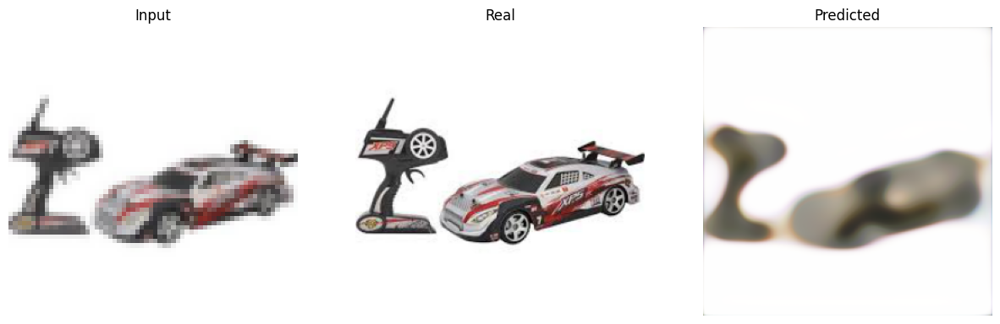

-----------------------------------------------------------
| End of epoch   7 | Time: 55.66s | Train psnr   17.531 | Train Loss    0.202 | Valid psnr   18.011 | Valid Loss    0.167 
-----------------------------------------------------------
| epoch   8 |    50/   86 batches | psnr   17.554


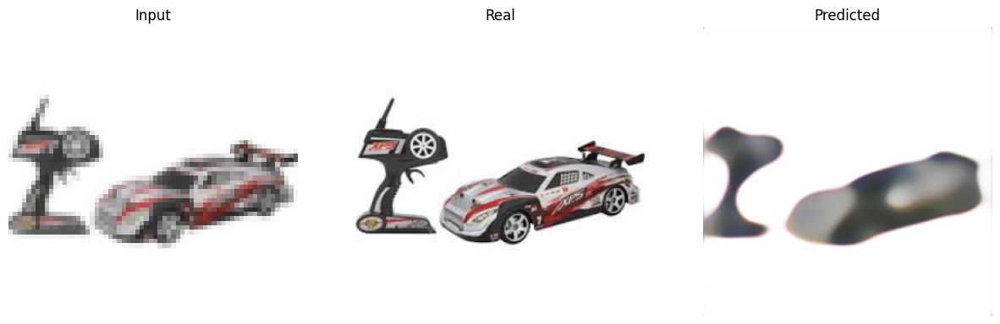

-----------------------------------------------------------
| End of epoch   8 | Time: 55.84s | Train psnr   17.890 | Train Loss    0.179 | Valid psnr   18.120 | Valid Loss    0.162 
-----------------------------------------------------------
| epoch   9 |    50/   86 batches | psnr   17.911
-----------------------------------------------------------
| End of epoch   9 | Time: 54.98s | Train psnr   18.017 | Train Loss    0.172 | Valid psnr   13.814 | Valid Loss    0.263 
-----------------------------------------------------------
| epoch  10 |    50/   86 batches | psnr   17.828
-----------------------------------------------------------
| End of epoch  10 | Time: 54.84s | Train psnr   17.691 | Train Loss    0.177 | Valid psnr   17.958 | Valid Loss    0.177 
-----------------------------------------------------------
| epoch  11 |    50/   86 batches | psnr   18.209


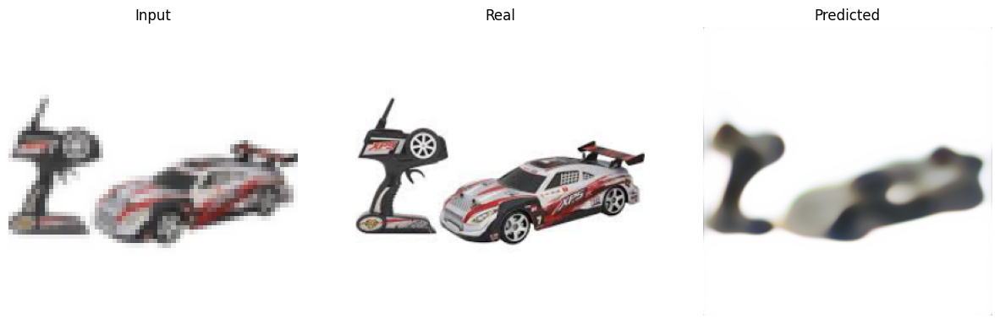

-----------------------------------------------------------
| End of epoch  11 | Time: 55.79s | Train psnr   18.323 | Train Loss    0.165 | Valid psnr   18.633 | Valid Loss    0.153 
-----------------------------------------------------------
| epoch  12 |    50/   86 batches | psnr   18.571


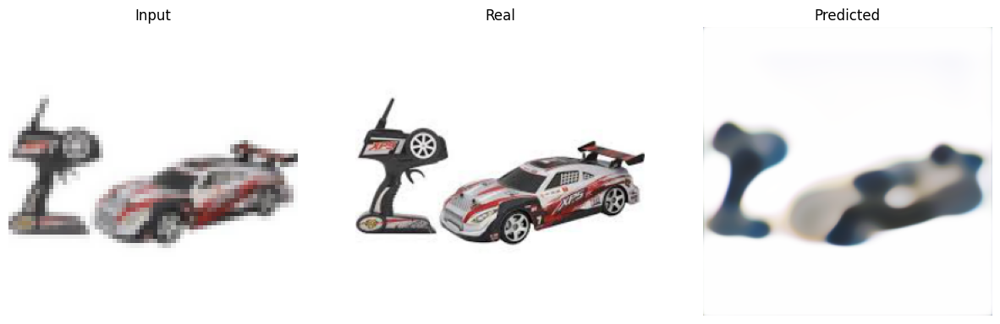

-----------------------------------------------------------
| End of epoch  12 | Time: 55.72s | Train psnr   18.612 | Train Loss    0.157 | Valid psnr   18.752 | Valid Loss    0.149 
-----------------------------------------------------------
| epoch  13 |    50/   86 batches | psnr   18.524
-----------------------------------------------------------
| End of epoch  13 | Time: 54.97s | Train psnr   18.701 | Train Loss    0.157 | Valid psnr   18.106 | Valid Loss    0.164 
-----------------------------------------------------------
| epoch  14 |    50/   86 batches | psnr   18.719


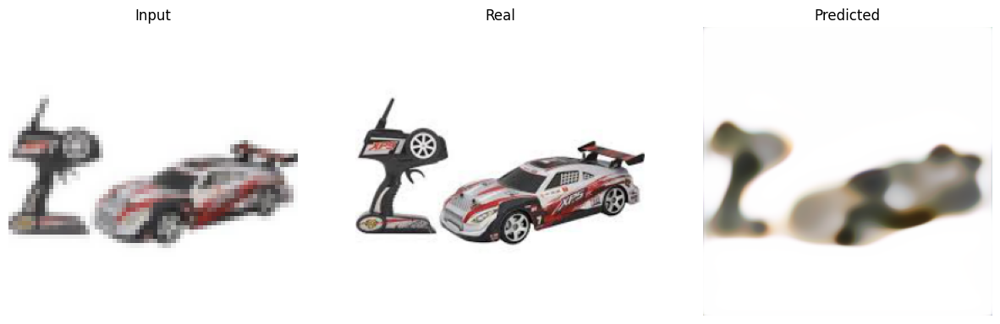

-----------------------------------------------------------
| End of epoch  14 | Time: 55.98s | Train psnr   18.654 | Train Loss    0.155 | Valid psnr   19.069 | Valid Loss    0.145 
-----------------------------------------------------------
| epoch  15 |    50/   86 batches | psnr   18.760
-----------------------------------------------------------
| End of epoch  15 | Time: 54.80s | Train psnr   18.692 | Train Loss    0.154 | Valid psnr   18.458 | Valid Loss    0.158 
-----------------------------------------------------------
| epoch  16 |    50/   86 batches | psnr   18.687


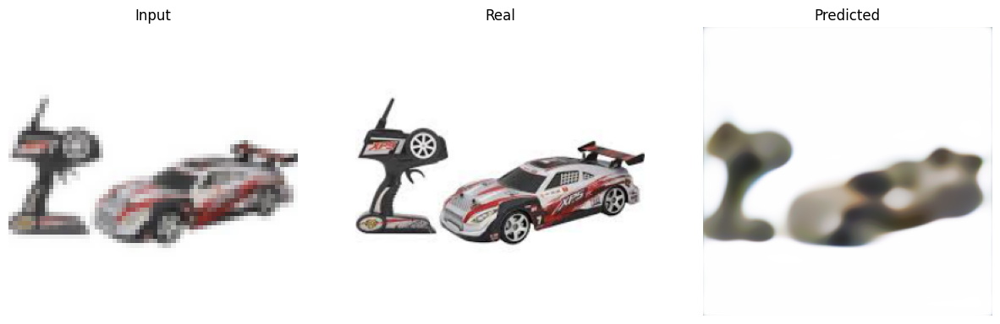

-----------------------------------------------------------
| End of epoch  16 | Time: 55.70s | Train psnr   18.796 | Train Loss    0.155 | Valid psnr   19.131 | Valid Loss    0.140 
-----------------------------------------------------------
| epoch  17 |    50/   86 batches | psnr   18.568


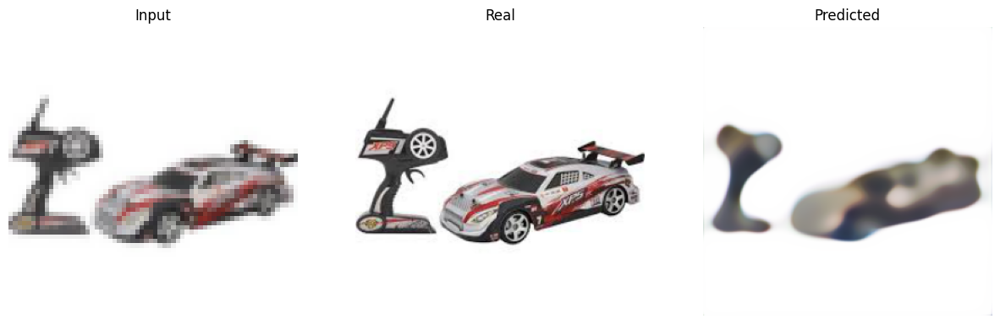

-----------------------------------------------------------
| End of epoch  17 | Time: 55.67s | Train psnr   19.018 | Train Loss    0.153 | Valid psnr   19.203 | Valid Loss    0.141 
-----------------------------------------------------------
| epoch  18 |    50/   86 batches | psnr   18.908
-----------------------------------------------------------
| End of epoch  18 | Time: 54.85s | Train psnr   19.049 | Train Loss    0.151 | Valid psnr   18.283 | Valid Loss    0.159 
-----------------------------------------------------------
| epoch  19 |    50/   86 batches | psnr   18.985
-----------------------------------------------------------
| End of epoch  19 | Time: 54.84s | Train psnr   19.056 | Train Loss    0.148 | Valid psnr   18.979 | Valid Loss    0.149 
-----------------------------------------------------------
| epoch  20 |    50/   86 batches | psnr   19.199


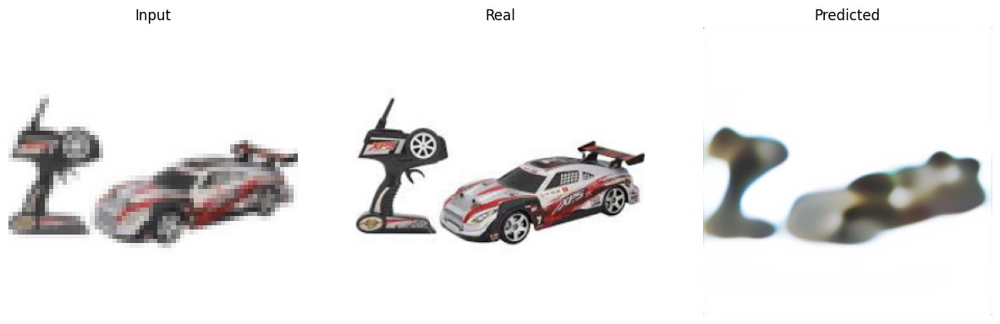

-----------------------------------------------------------
| End of epoch  20 | Time: 55.55s | Train psnr   19.192 | Train Loss    0.145 | Valid psnr   19.292 | Valid Loss    0.140 
-----------------------------------------------------------
| epoch  21 |    50/   86 batches | psnr   19.314


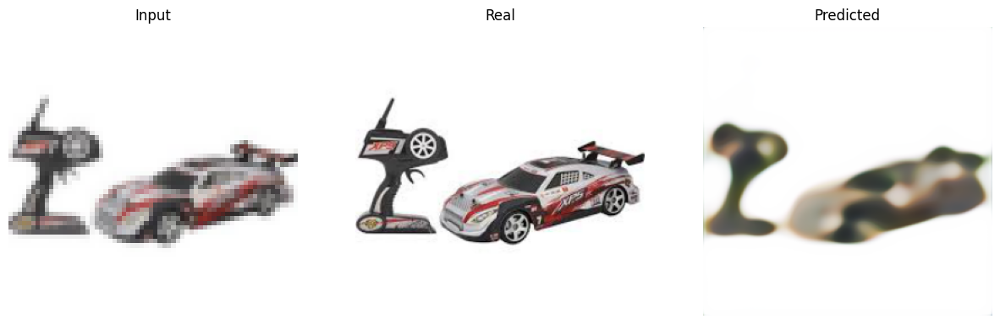

-----------------------------------------------------------
| End of epoch  21 | Time: 55.94s | Train psnr   19.165 | Train Loss    0.145 | Valid psnr   19.538 | Valid Loss    0.135 
-----------------------------------------------------------
| epoch  22 |    50/   86 batches | psnr   19.367
-----------------------------------------------------------
| End of epoch  22 | Time: 54.79s | Train psnr   19.375 | Train Loss    0.143 | Valid psnr   19.416 | Valid Loss    0.146 
-----------------------------------------------------------
| epoch  23 |    50/   86 batches | psnr   19.298
-----------------------------------------------------------
| End of epoch  23 | Time: 54.83s | Train psnr   19.624 | Train Loss    0.142 | Valid psnr   19.495 | Valid Loss    0.139 
-----------------------------------------------------------
| epoch  24 |    50/   86 batches | psnr   18.449
-----------------------------------------------------------
| End of epoch  24 | Time: 54.92s | Train psnr   18.897 | Tra

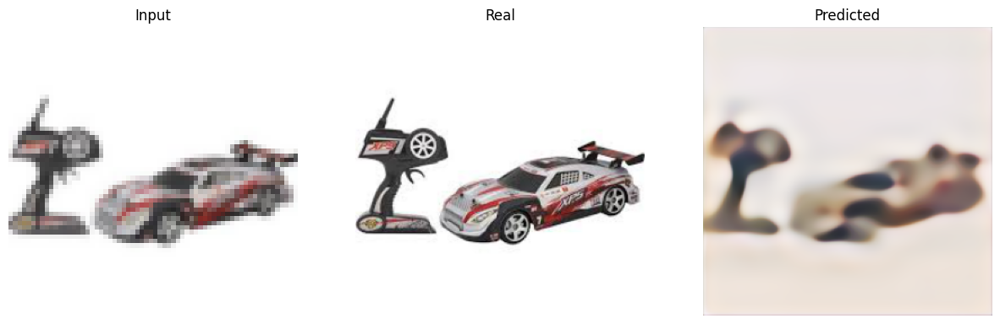

-----------------------------------------------------------
| End of epoch  28 | Time: 55.72s | Train psnr   19.618 | Train Loss    0.138 | Valid psnr   19.620 | Valid Loss    0.145 
-----------------------------------------------------------
| epoch  29 |    50/   86 batches | psnr   19.802


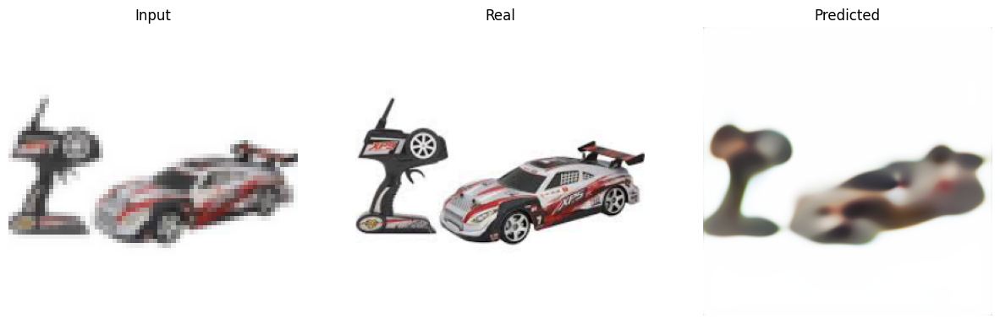

-----------------------------------------------------------
| End of epoch  29 | Time: 56.03s | Train psnr   20.149 | Train Loss    0.131 | Valid psnr   19.899 | Valid Loss    0.126 
-----------------------------------------------------------
| epoch  30 |    50/   86 batches | psnr   19.960


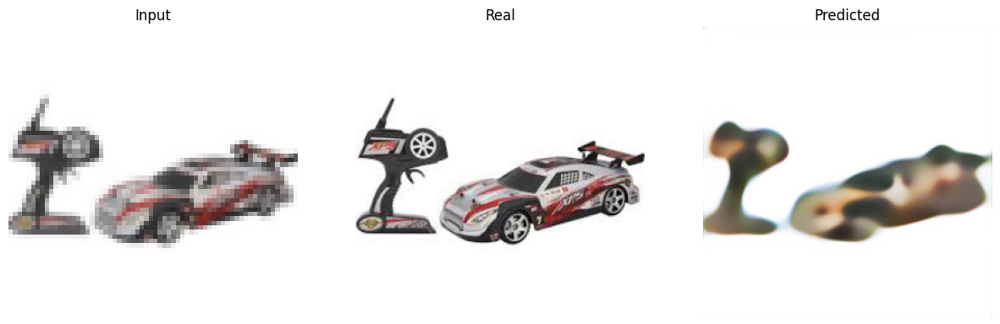

-----------------------------------------------------------
| End of epoch  30 | Time: 55.73s | Train psnr   20.193 | Train Loss    0.130 | Valid psnr   20.106 | Valid Loss    0.127 
-----------------------------------------------------------
| epoch  31 |    50/   86 batches | psnr   19.899
-----------------------------------------------------------
| End of epoch  31 | Time: 54.98s | Train psnr   20.095 | Train Loss    0.132 | Valid psnr   19.687 | Valid Loss    0.132 
-----------------------------------------------------------
| epoch  32 |    50/   86 batches | psnr   20.242
-----------------------------------------------------------
| End of epoch  32 | Time: 54.84s | Train psnr   20.011 | Train Loss    0.128 | Valid psnr   19.884 | Valid Loss    0.132 
-----------------------------------------------------------
| epoch  33 |    50/   86 batches | psnr   20.393


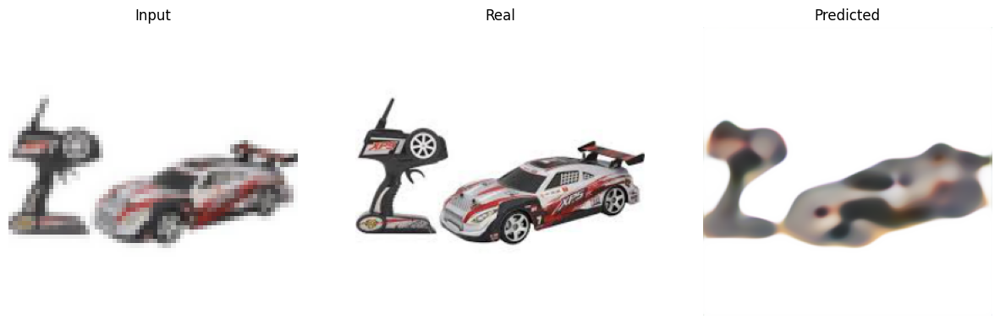

-----------------------------------------------------------
| End of epoch  33 | Time: 55.68s | Train psnr   20.065 | Train Loss    0.127 | Valid psnr   20.144 | Valid Loss    0.127 
-----------------------------------------------------------
| epoch  34 |    50/   86 batches | psnr   20.270
-----------------------------------------------------------
| End of epoch  34 | Time: 54.98s | Train psnr   20.175 | Train Loss    0.128 | Valid psnr   20.093 | Valid Loss    0.125 
-----------------------------------------------------------
| epoch  35 |    50/   86 batches | psnr   20.282


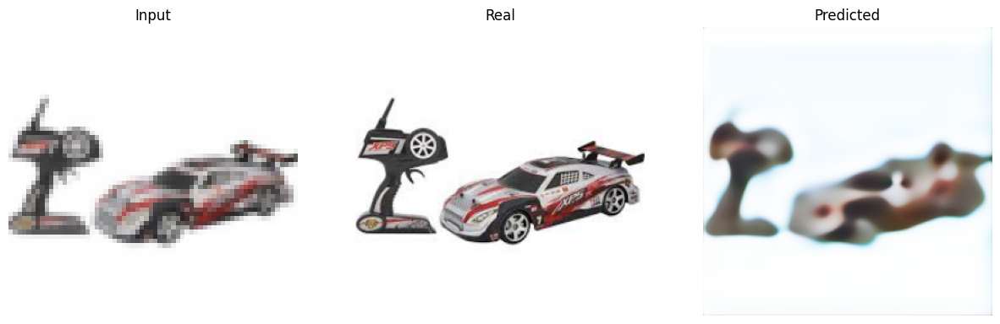

-----------------------------------------------------------
| End of epoch  35 | Time: 55.81s | Train psnr   20.101 | Train Loss    0.128 | Valid psnr   20.189 | Valid Loss    0.125 
-----------------------------------------------------------
| epoch  36 |    50/   86 batches | psnr   20.153
-----------------------------------------------------------
| End of epoch  36 | Time: 54.98s | Train psnr   20.349 | Train Loss    0.128 | Valid psnr   20.103 | Valid Loss    0.129 
-----------------------------------------------------------
| epoch  37 |    50/   86 batches | psnr   20.520
-----------------------------------------------------------
| End of epoch  37 | Time: 54.67s | Train psnr   17.639 | Train Loss    0.146 | Valid psnr   16.675 | Valid Loss    0.220 
-----------------------------------------------------------
| epoch  38 |    50/   86 batches | psnr   18.554
-----------------------------------------------------------
| End of epoch  38 | Time: 54.99s | Train psnr   19.392 | Tra

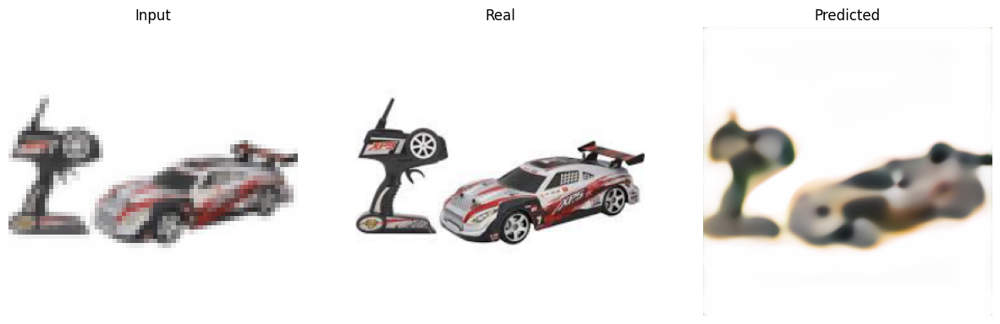

-----------------------------------------------------------
| End of epoch  41 | Time: 55.77s | Train psnr   20.500 | Train Loss    0.126 | Valid psnr   20.480 | Valid Loss    0.121 
-----------------------------------------------------------
| epoch  42 |    50/   86 batches | psnr   20.544
-----------------------------------------------------------
| End of epoch  42 | Time: 54.76s | Train psnr   20.368 | Train Loss    0.123 | Valid psnr   20.081 | Valid Loss    0.129 
-----------------------------------------------------------
| epoch  43 |    50/   86 batches | psnr   20.547
-----------------------------------------------------------
| End of epoch  43 | Time: 54.92s | Train psnr   20.647 | Train Loss    0.121 | Valid psnr   20.200 | Valid Loss    0.125 
-----------------------------------------------------------
| epoch  44 |    50/   86 batches | psnr   20.548


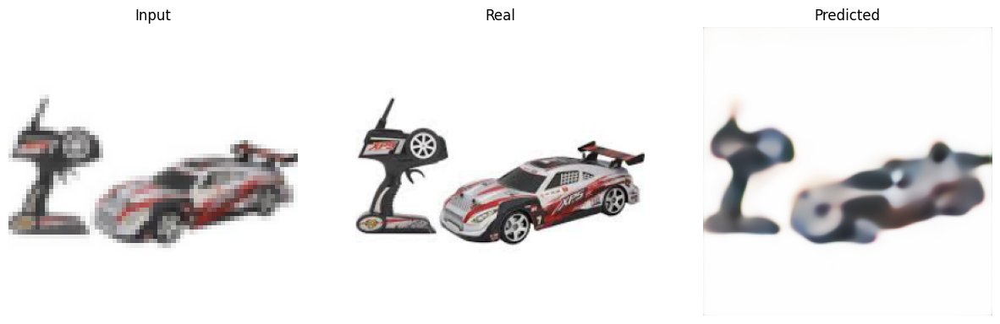

-----------------------------------------------------------
| End of epoch  44 | Time: 55.67s | Train psnr   20.532 | Train Loss    0.122 | Valid psnr   20.664 | Valid Loss    0.121 
-----------------------------------------------------------
| epoch  45 |    50/   86 batches | psnr   20.648


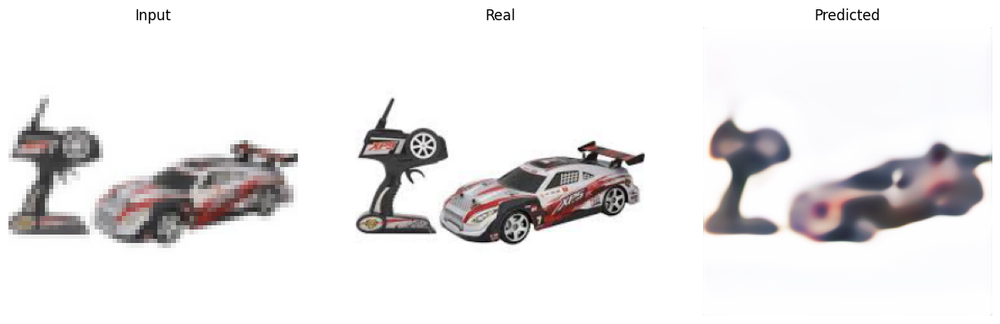

-----------------------------------------------------------
| End of epoch  45 | Time: 55.71s | Train psnr   20.611 | Train Loss    0.122 | Valid psnr   20.714 | Valid Loss    0.118 
-----------------------------------------------------------
| epoch  46 |    50/   86 batches | psnr   20.569


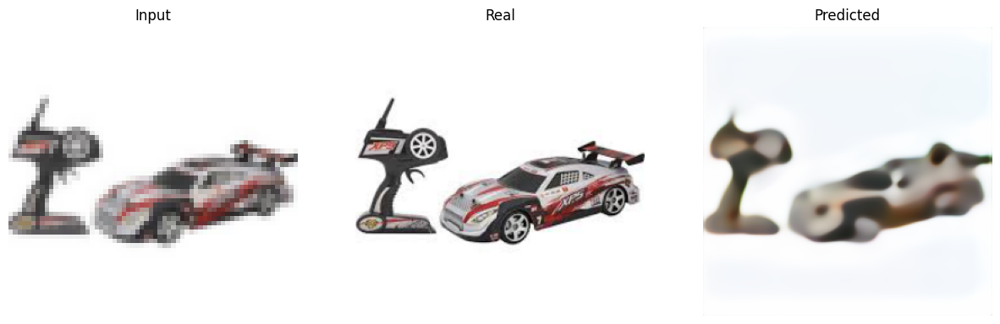

-----------------------------------------------------------
| End of epoch  46 | Time: 55.66s | Train psnr   20.715 | Train Loss    0.121 | Valid psnr   20.717 | Valid Loss    0.117 
-----------------------------------------------------------
| epoch  47 |    50/   86 batches | psnr   20.543
-----------------------------------------------------------
| End of epoch  47 | Time: 54.93s | Train psnr   21.085 | Train Loss    0.119 | Valid psnr   20.677 | Valid Loss    0.119 
-----------------------------------------------------------
| epoch  48 |    50/   86 batches | psnr   20.874
-----------------------------------------------------------
| End of epoch  48 | Time: 54.76s | Train psnr   20.633 | Train Loss    0.118 | Valid psnr   20.667 | Valid Loss    0.118 
-----------------------------------------------------------
| epoch  49 |    50/   86 batches | psnr   20.725
-----------------------------------------------------------
| End of epoch  49 | Time: 54.84s | Train psnr   18.836 | Tra

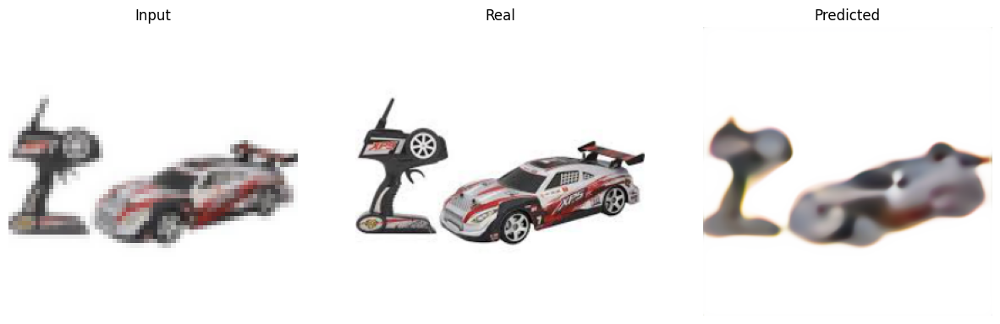

-----------------------------------------------------------
| End of epoch  53 | Time: 55.77s | Train psnr   20.985 | Train Loss    0.116 | Valid psnr   20.815 | Valid Loss    0.117 
-----------------------------------------------------------
| epoch  54 |    50/   86 batches | psnr   20.260
-----------------------------------------------------------
| End of epoch  54 | Time: 54.87s | Train psnr   20.615 | Train Loss    0.125 | Valid psnr   20.004 | Valid Loss    0.128 
-----------------------------------------------------------
| epoch  55 |    50/   86 batches | psnr   20.745
-----------------------------------------------------------
| End of epoch  55 | Time: 54.88s | Train psnr   20.601 | Train Loss    0.122 | Valid psnr   20.618 | Valid Loss    0.121 
-----------------------------------------------------------
| epoch  56 |    50/   86 batches | psnr   21.036
-----------------------------------------------------------
| End of epoch  56 | Time: 54.89s | Train psnr   20.725 | Tra

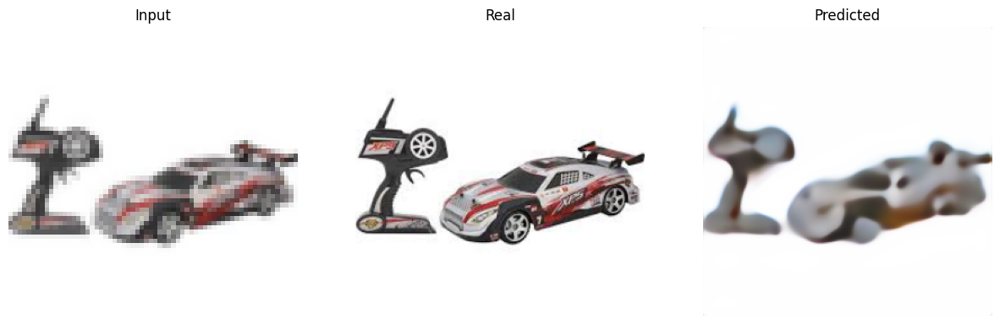

-----------------------------------------------------------
| End of epoch  62 | Time: 55.76s | Train psnr   20.970 | Train Loss    0.113 | Valid psnr   21.039 | Valid Loss    0.114 
-----------------------------------------------------------
| epoch  63 |    50/   86 batches | psnr   21.199
-----------------------------------------------------------
| End of epoch  63 | Time: 54.83s | Train psnr   21.199 | Train Loss    0.112 | Valid psnr   20.236 | Valid Loss    0.124 
-----------------------------------------------------------
| epoch  64 |    50/   86 batches | psnr   21.245


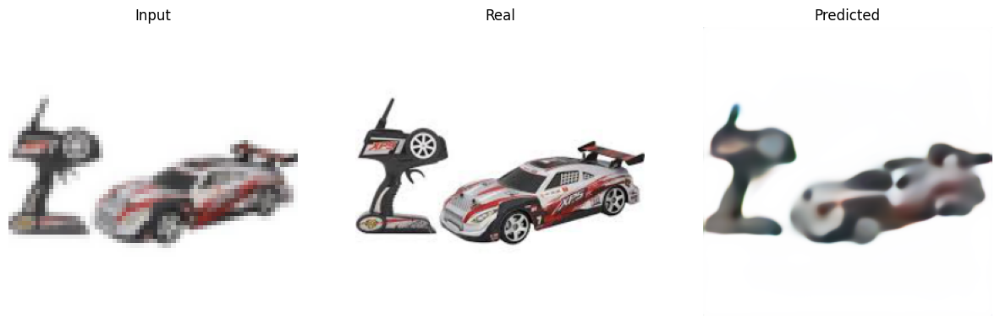

-----------------------------------------------------------
| End of epoch  64 | Time: 55.68s | Train psnr   21.241 | Train Loss    0.111 | Valid psnr   21.040 | Valid Loss    0.115 
-----------------------------------------------------------
| epoch  65 |    50/   86 batches | psnr   21.439
-----------------------------------------------------------
| End of epoch  65 | Time: 55.04s | Train psnr   21.108 | Train Loss    0.110 | Valid psnr   20.959 | Valid Loss    0.113 
-----------------------------------------------------------
| epoch  66 |    50/   86 batches | psnr   21.367
-----------------------------------------------------------
| End of epoch  66 | Time: 54.88s | Train psnr   21.339 | Train Loss    0.110 | Valid psnr   20.111 | Valid Loss    0.135 
-----------------------------------------------------------
| epoch  67 |    50/   86 batches | psnr   21.347
-----------------------------------------------------------
| End of epoch  67 | Time: 54.96s | Train psnr   21.261 | Tra

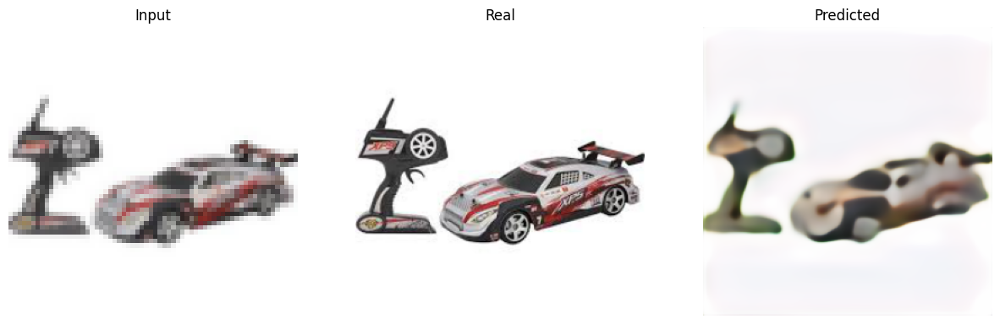

-----------------------------------------------------------
| End of epoch  71 | Time: 55.62s | Train psnr   21.295 | Train Loss    0.110 | Valid psnr   21.184 | Valid Loss    0.110 
-----------------------------------------------------------
| epoch  72 |    50/   86 batches | psnr   21.469
-----------------------------------------------------------
| End of epoch  72 | Time: 54.95s | Train psnr   21.616 | Train Loss    0.107 | Valid psnr   21.144 | Valid Loss    0.114 
-----------------------------------------------------------
| epoch  73 |    50/   86 batches | psnr   21.524
-----------------------------------------------------------
| End of epoch  73 | Time: 54.78s | Train psnr   21.162 | Train Loss    0.110 | Valid psnr   17.238 | Valid Loss    0.179 
-----------------------------------------------------------
| epoch  74 |    50/   86 batches | psnr   21.249


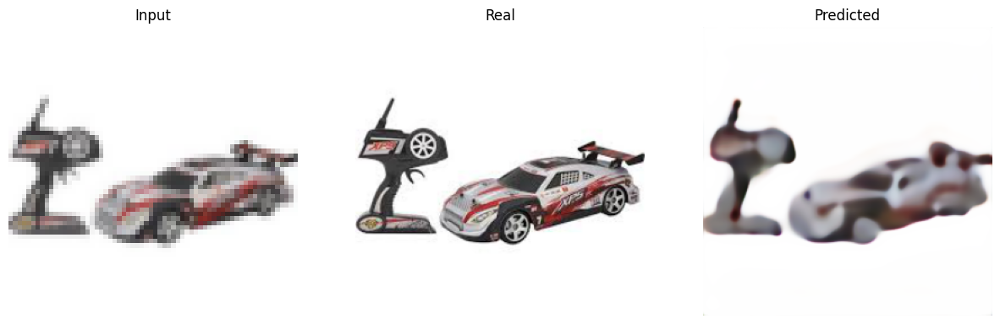

-----------------------------------------------------------
| End of epoch  74 | Time: 55.71s | Train psnr   21.357 | Train Loss    0.111 | Valid psnr   21.329 | Valid Loss    0.108 
-----------------------------------------------------------
| epoch  75 |    50/   86 batches | psnr   21.666
-----------------------------------------------------------
| End of epoch  75 | Time: 54.90s | Train psnr   21.371 | Train Loss    0.107 | Valid psnr   21.095 | Valid Loss    0.110 
-----------------------------------------------------------
| epoch  76 |    50/   86 batches | psnr   21.487


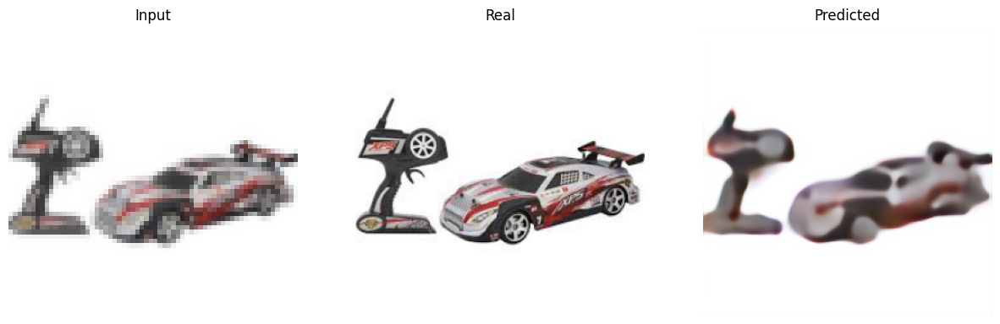

-----------------------------------------------------------
| End of epoch  76 | Time: 55.59s | Train psnr   21.571 | Train Loss    0.108 | Valid psnr   21.331 | Valid Loss    0.107 
-----------------------------------------------------------
| epoch  77 |    50/   86 batches | psnr   21.513
-----------------------------------------------------------
| End of epoch  77 | Time: 54.86s | Train psnr   21.631 | Train Loss    0.107 | Valid psnr   20.913 | Valid Loss    0.117 
-----------------------------------------------------------
| epoch  78 |    50/   86 batches | psnr   21.656
-----------------------------------------------------------
| End of epoch  78 | Time: 54.78s | Train psnr   21.517 | Train Loss    0.106 | Valid psnr   21.284 | Valid Loss    0.116 
-----------------------------------------------------------
| epoch  79 |    50/   86 batches | psnr   21.707
-----------------------------------------------------------
| End of epoch  79 | Time: 54.99s | Train psnr   21.593 | Tra

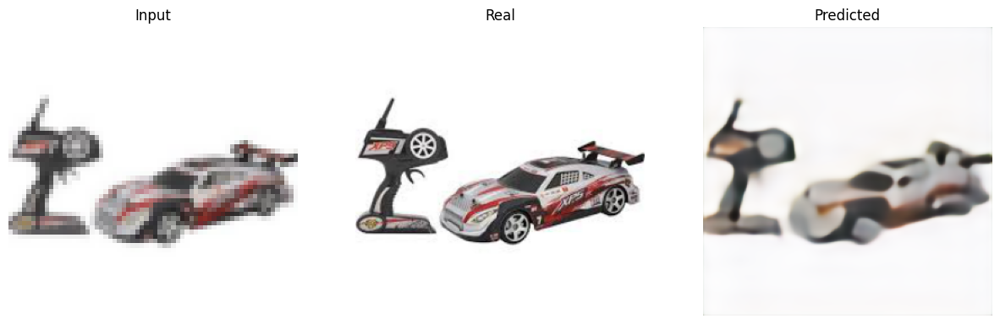

-----------------------------------------------------------
| End of epoch  85 | Time: 55.78s | Train psnr   21.749 | Train Loss    0.103 | Valid psnr   21.351 | Valid Loss    0.114 
-----------------------------------------------------------
| epoch  86 |    50/   86 batches | psnr   21.693
-----------------------------------------------------------
| End of epoch  86 | Time: 54.91s | Train psnr   21.927 | Train Loss    0.104 | Valid psnr   21.182 | Valid Loss    0.115 
-----------------------------------------------------------
| epoch  87 |    50/   86 batches | psnr   21.706
-----------------------------------------------------------
| End of epoch  87 | Time: 54.76s | Train psnr   21.844 | Train Loss    0.104 | Valid psnr   21.157 | Valid Loss    0.112 
-----------------------------------------------------------
| epoch  88 |    50/   86 batches | psnr   21.871


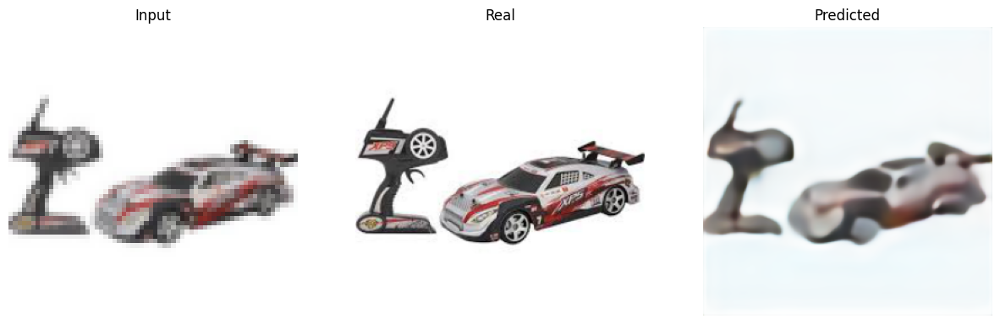

-----------------------------------------------------------
| End of epoch  88 | Time: 55.63s | Train psnr   21.955 | Train Loss    0.102 | Valid psnr   21.425 | Valid Loss    0.112 
-----------------------------------------------------------
| epoch  89 |    50/   86 batches | psnr   21.842


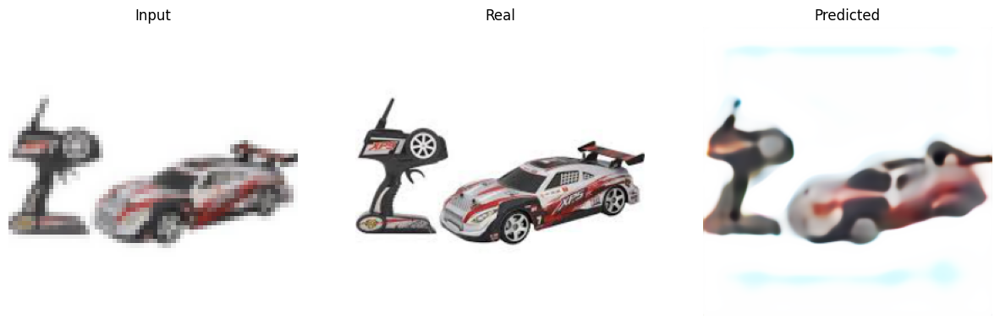

-----------------------------------------------------------
| End of epoch  89 | Time: 55.76s | Train psnr   22.031 | Train Loss    0.102 | Valid psnr   21.469 | Valid Loss    0.107 
-----------------------------------------------------------
| epoch  90 |    50/   86 batches | psnr   21.895
-----------------------------------------------------------
| End of epoch  90 | Time: 54.83s | Train psnr   21.723 | Train Loss    0.104 | Valid psnr   21.404 | Valid Loss    0.110 
-----------------------------------------------------------
| epoch  91 |    50/   86 batches | psnr   21.978


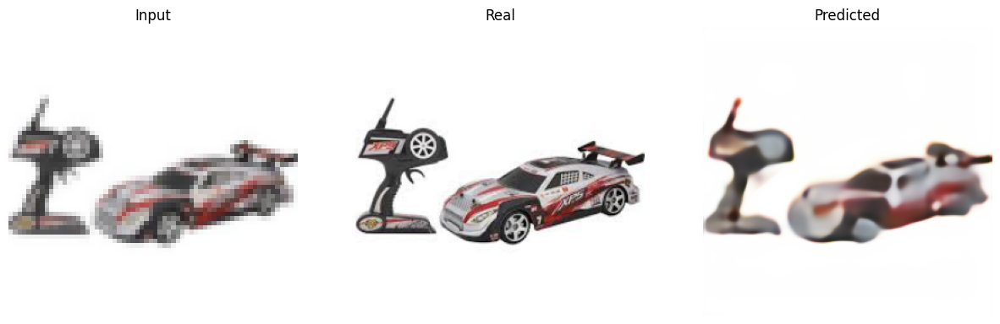

-----------------------------------------------------------
| End of epoch  91 | Time: 55.81s | Train psnr   21.796 | Train Loss    0.102 | Valid psnr   21.679 | Valid Loss    0.101 
-----------------------------------------------------------
| epoch  92 |    50/   86 batches | psnr   22.021
-----------------------------------------------------------
| End of epoch  92 | Time: 55.09s | Train psnr   21.981 | Train Loss    0.101 | Valid psnr   21.303 | Valid Loss    0.106 
-----------------------------------------------------------
| epoch  93 |    50/   86 batches | psnr   21.864
-----------------------------------------------------------
| End of epoch  93 | Time: 54.60s | Train psnr   22.094 | Train Loss    0.101 | Valid psnr   20.915 | Valid Loss    0.115 
-----------------------------------------------------------
| epoch  94 |    50/   86 batches | psnr   21.973
-----------------------------------------------------------
| End of epoch  94 | Time: 54.98s | Train psnr   22.122 | Tra

<ipython-input-14-9140fde4fd84>:36: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model + f'/{model_name}.pt'))


In [ ]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
SR_unet_model_noskip = SR_Unet_NoSkip().to(device)
SR_unet_model_noskip.to(device)

criterion = nn.L1Loss()

optimizer = optim.Adam(SR_unet_model_noskip.parameters(), lr=1e-4, betas=[0.5,0.999])

save_model = './UNET'
os.makedirs(save_model, exist_ok = True)

EPOCHS = 100
SR_unet_model_noskip, metrics = train(
    SR_unet_model_noskip, 'SR_unet_model_noskip', save_model, optimizer, criterion, train_loader, test_loader, EPOCHS, device
)

In [ ]:
test_psnr, test_loss = evaluate_epoch(SR_unet_model_noskip, criterion, test_loader, device)
test_psnr, test_loss

(tensor(21.6795, device='cuda:0'), 0.10124953294342215)

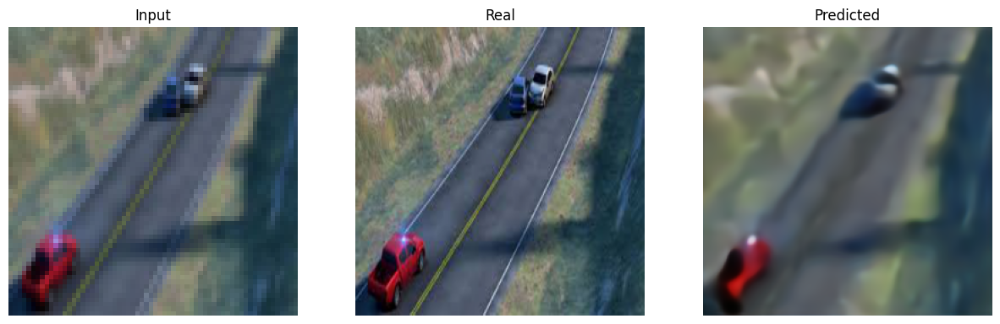

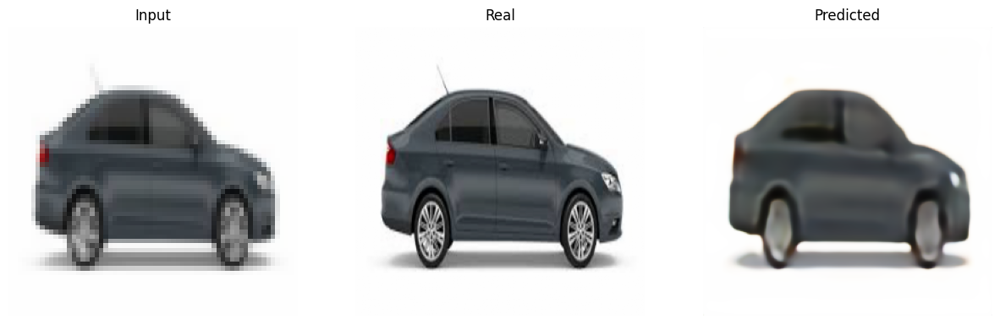

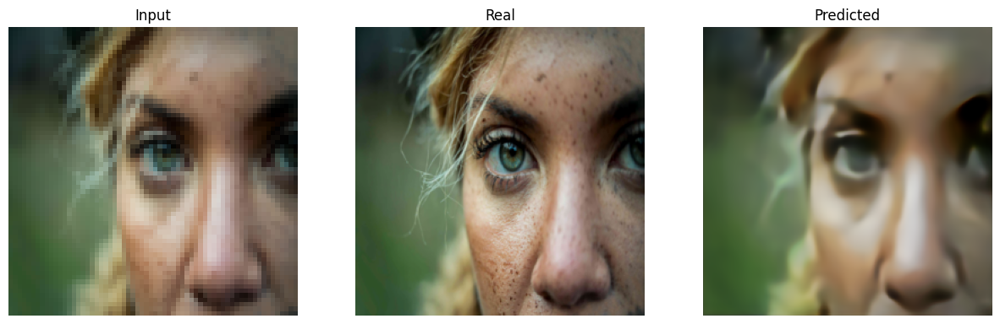

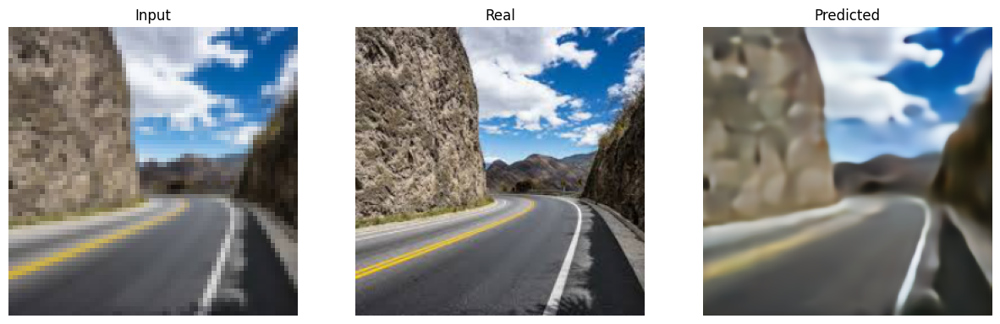

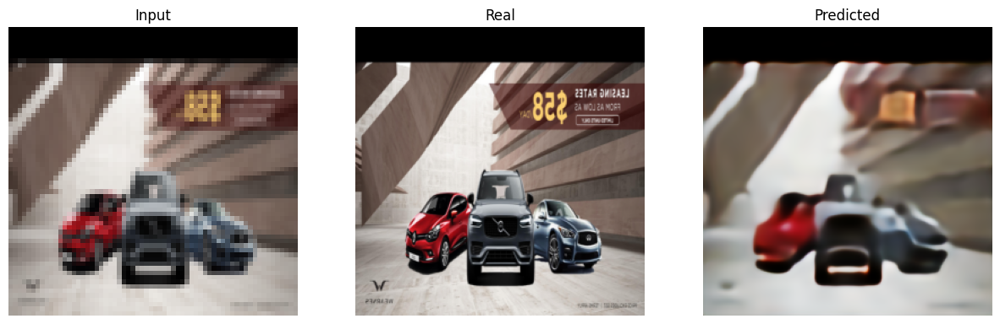

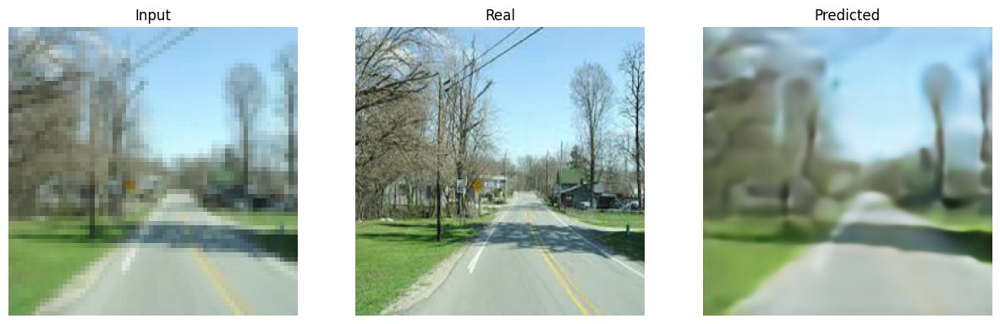

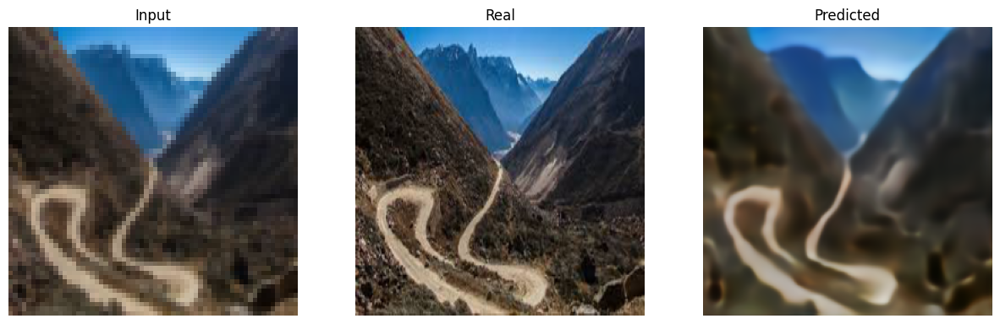

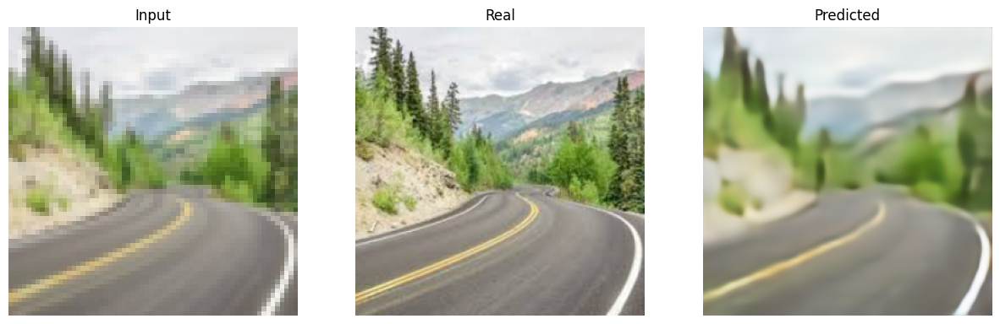

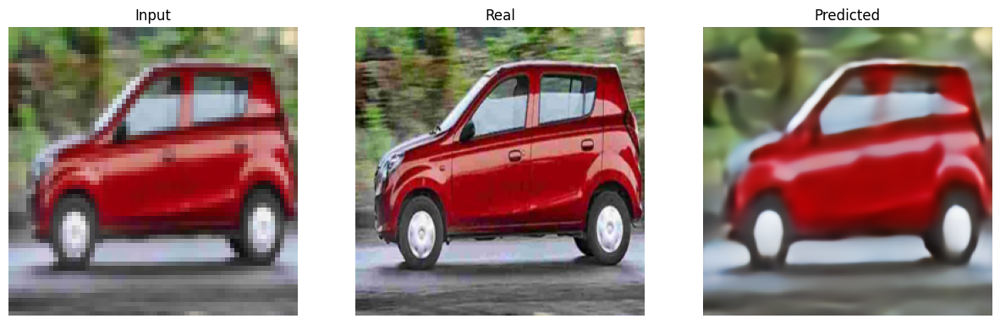

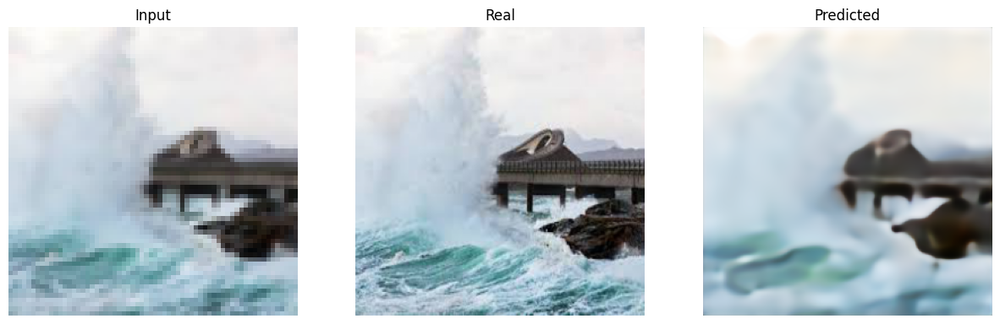

In [ ]:
predict_and_display(SR_unet_model_noskip, train_loader, device)

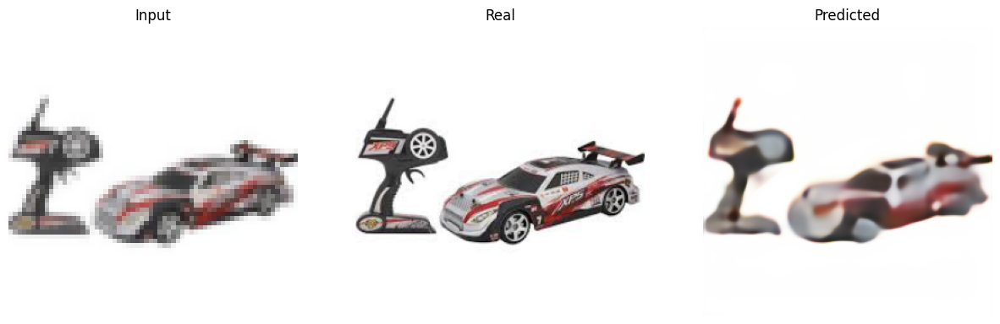

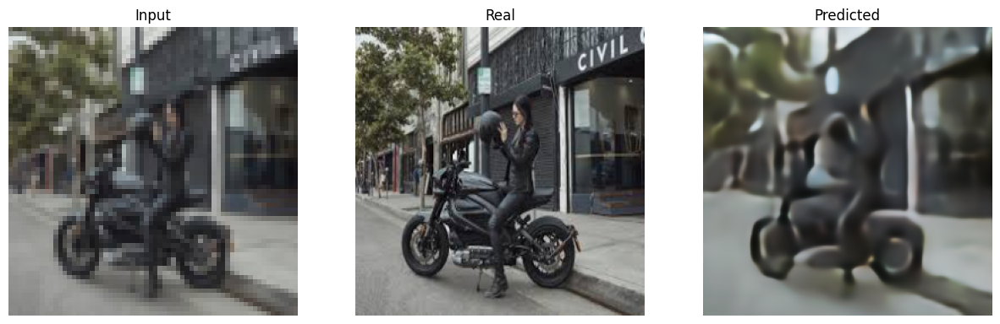

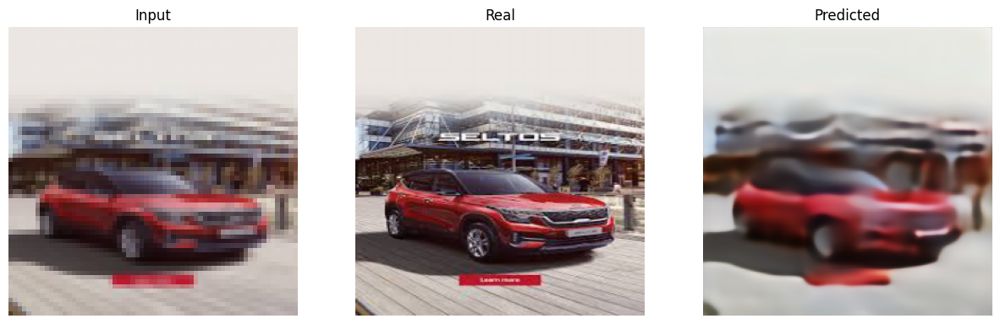

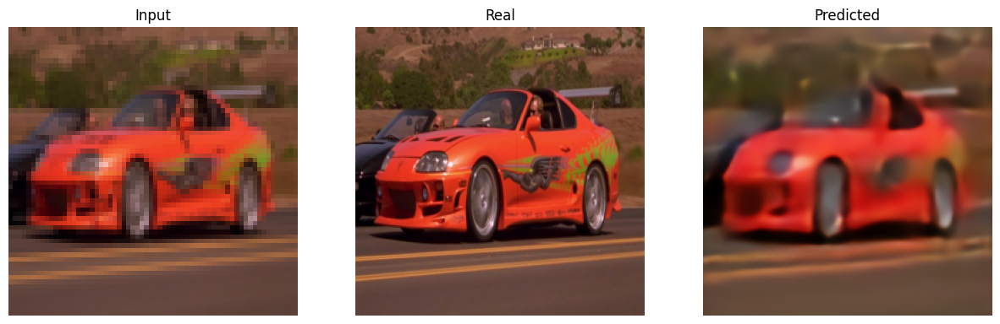

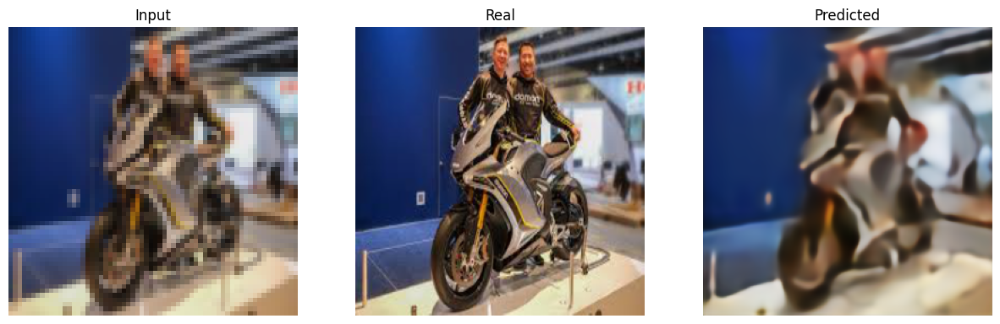

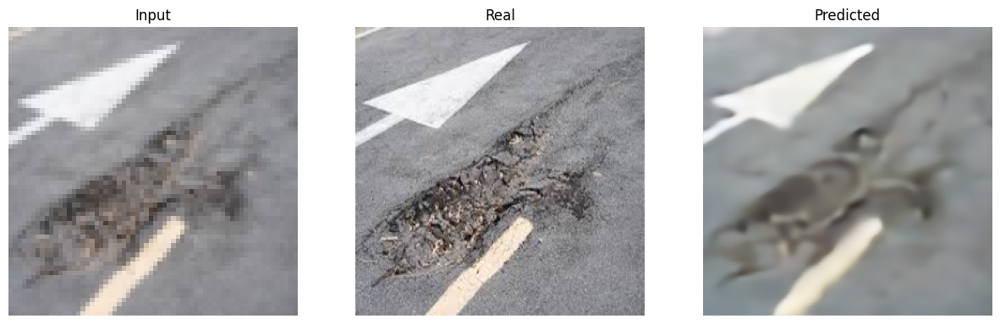

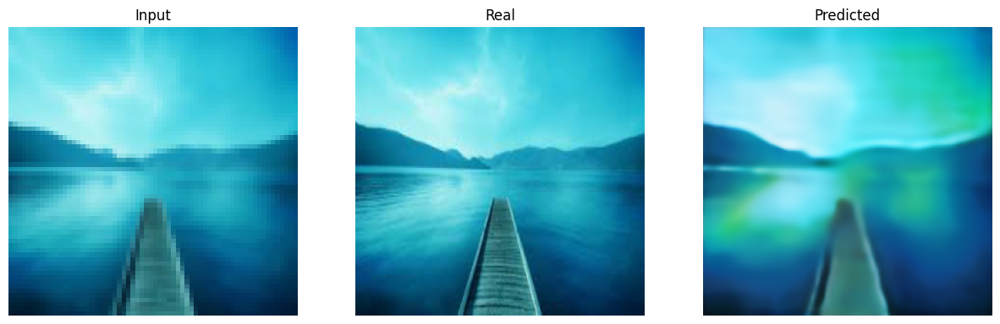

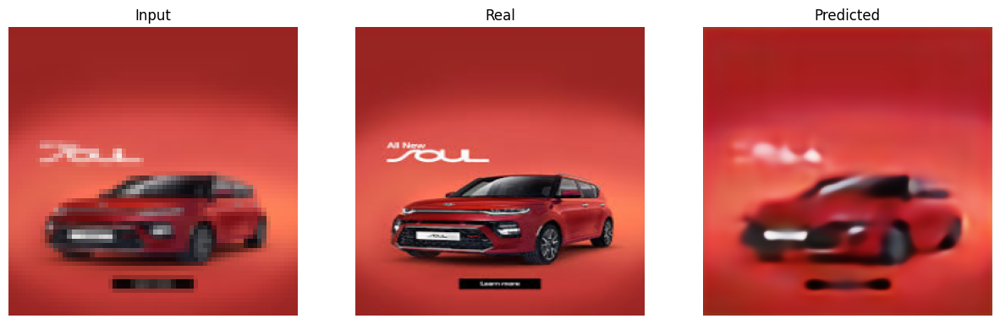

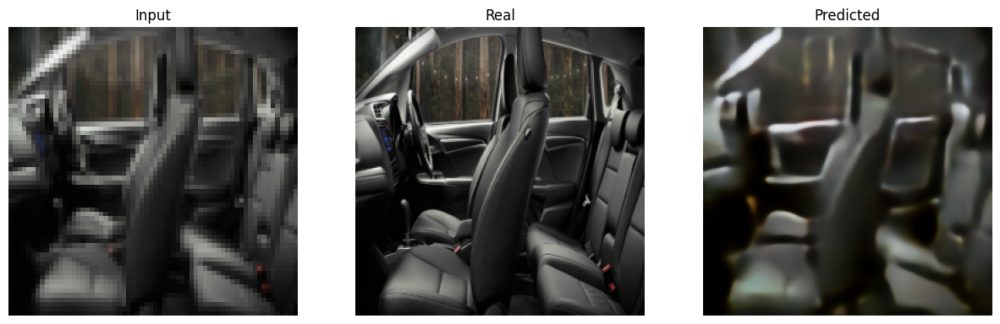

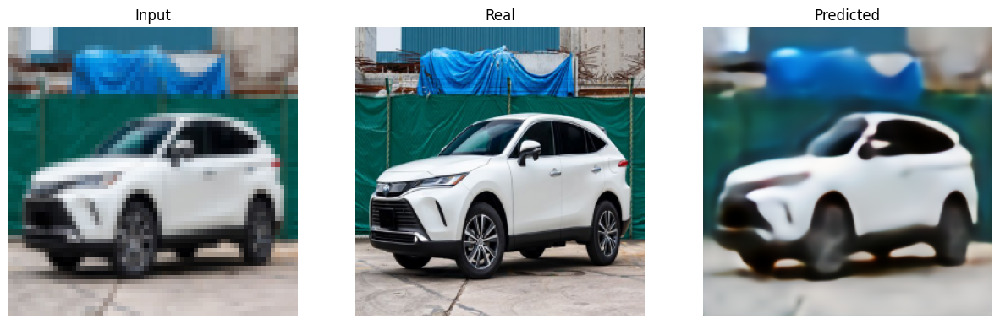

In [ ]:
predict_and_display(SR_unet_model_noskip, test_loader, device)

| epoch   1 |    50/   86 batches | psnr   18.844


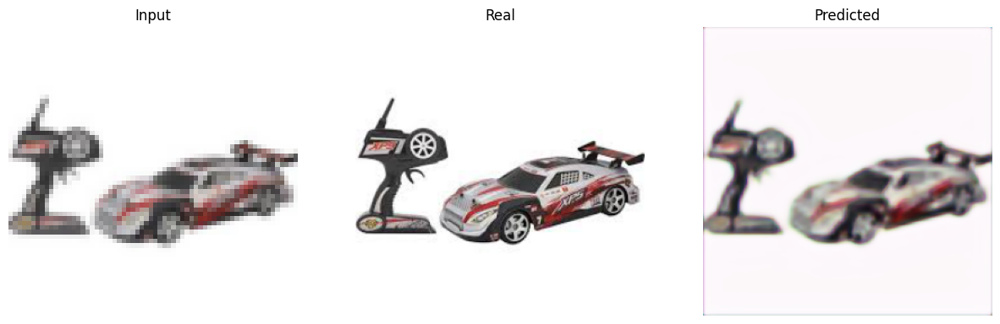

-----------------------------------------------------------
| End of epoch   1 | Time: 51.59s | Train psnr   21.000 | Train Loss    0.161 | Valid psnr   21.214 | Valid Loss    0.116 
-----------------------------------------------------------
| epoch   2 |    50/   86 batches | psnr   21.611


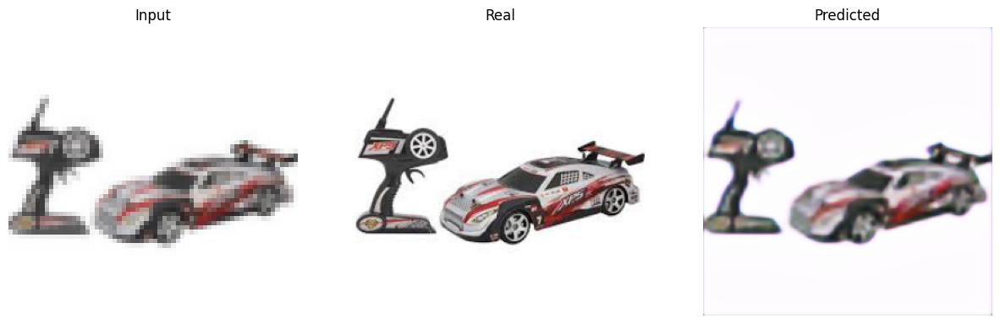

-----------------------------------------------------------
| End of epoch   2 | Time: 53.42s | Train psnr   22.509 | Train Loss    0.114 | Valid psnr   22.820 | Valid Loss    0.092 
-----------------------------------------------------------
| epoch   3 |    50/   86 batches | psnr   22.335


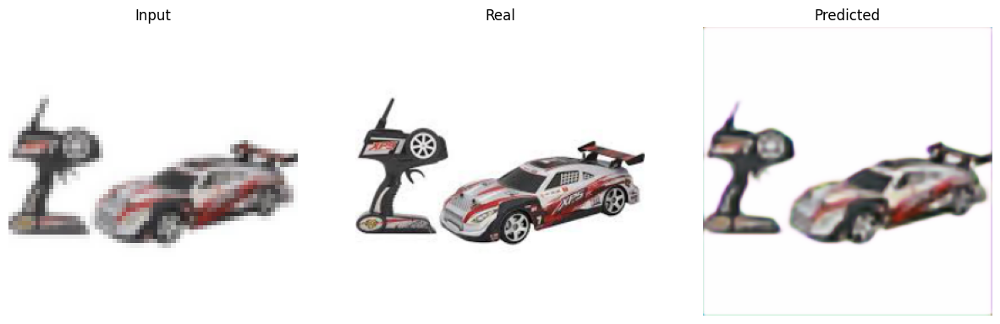

-----------------------------------------------------------
| End of epoch   3 | Time: 53.20s | Train psnr   22.374 | Train Loss    0.110 | Valid psnr   23.282 | Valid Loss    0.088 
-----------------------------------------------------------
| epoch   4 |    50/   86 batches | psnr   22.761
-----------------------------------------------------------
| End of epoch   4 | Time: 52.14s | Train psnr   22.782 | Train Loss    0.103 | Valid psnr   22.406 | Valid Loss    0.097 
-----------------------------------------------------------
| epoch   5 |    50/   86 batches | psnr   23.138


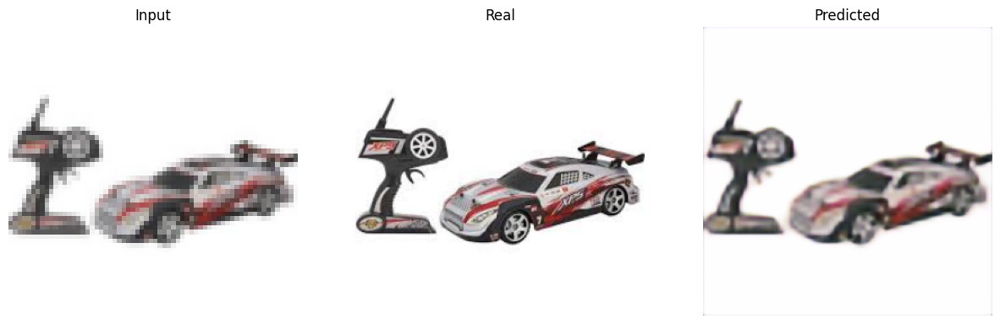

-----------------------------------------------------------
| End of epoch   5 | Time: 53.00s | Train psnr   23.030 | Train Loss    0.098 | Valid psnr   23.873 | Valid Loss    0.083 
-----------------------------------------------------------
| epoch   6 |    50/   86 batches | psnr   23.287


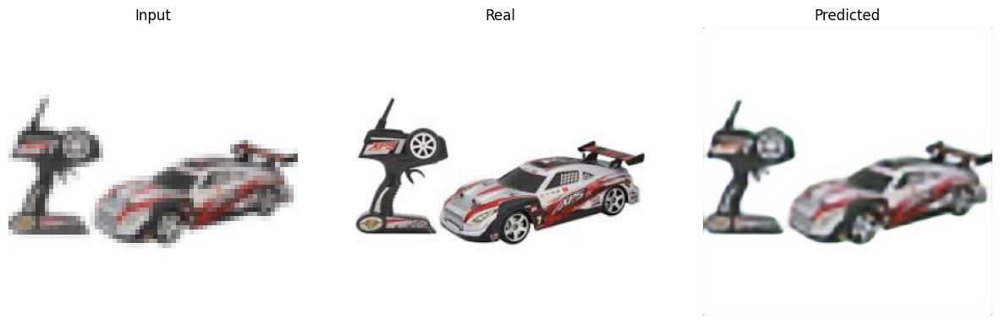

-----------------------------------------------------------
| End of epoch   6 | Time: 52.88s | Train psnr   23.496 | Train Loss    0.094 | Valid psnr   23.983 | Valid Loss    0.079 
-----------------------------------------------------------
| epoch   7 |    50/   86 batches | psnr   23.696
-----------------------------------------------------------
| End of epoch   7 | Time: 51.96s | Train psnr   23.543 | Train Loss    0.090 | Valid psnr   23.728 | Valid Loss    0.081 
-----------------------------------------------------------
| epoch   8 |    50/   86 batches | psnr   23.537
-----------------------------------------------------------
| End of epoch   8 | Time: 52.10s | Train psnr   23.583 | Train Loss    0.092 | Valid psnr   23.312 | Valid Loss    0.093 
-----------------------------------------------------------
| epoch   9 |    50/   86 batches | psnr   23.816
-----------------------------------------------------------
| End of epoch   9 | Time: 52.08s | Train psnr   23.755 | Tra

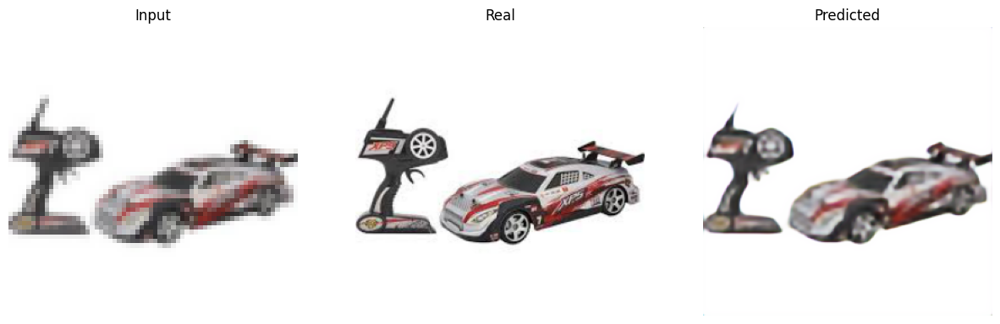

-----------------------------------------------------------
| End of epoch  10 | Time: 52.61s | Train psnr   23.831 | Train Loss    0.086 | Valid psnr   24.455 | Valid Loss    0.074 
-----------------------------------------------------------
| epoch  11 |    50/   86 batches | psnr   23.856


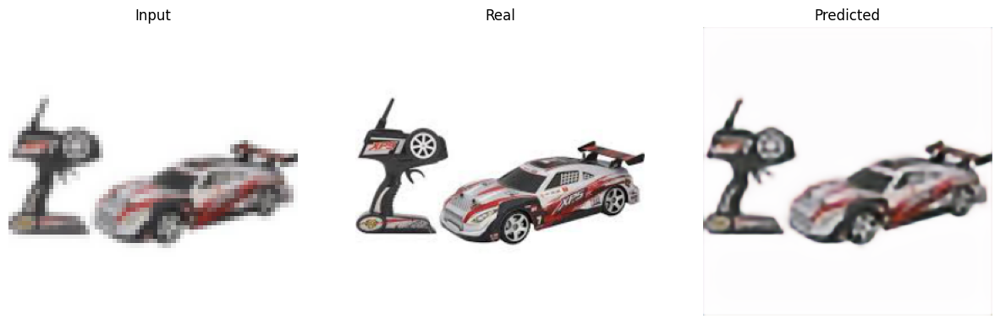

-----------------------------------------------------------
| End of epoch  11 | Time: 53.08s | Train psnr   23.720 | Train Loss    0.088 | Valid psnr   24.572 | Valid Loss    0.075 
-----------------------------------------------------------
| epoch  12 |    50/   86 batches | psnr   23.748
-----------------------------------------------------------
| End of epoch  12 | Time: 52.07s | Train psnr   23.969 | Train Loss    0.087 | Valid psnr   24.387 | Valid Loss    0.076 
-----------------------------------------------------------
| epoch  13 |    50/   86 batches | psnr   23.904
-----------------------------------------------------------
| End of epoch  13 | Time: 52.05s | Train psnr   24.271 | Train Loss    0.084 | Valid psnr   24.517 | Valid Loss    0.076 
-----------------------------------------------------------
| epoch  14 |    50/   86 batches | psnr   23.963
-----------------------------------------------------------
| End of epoch  14 | Time: 52.30s | Train psnr   24.133 | Tra

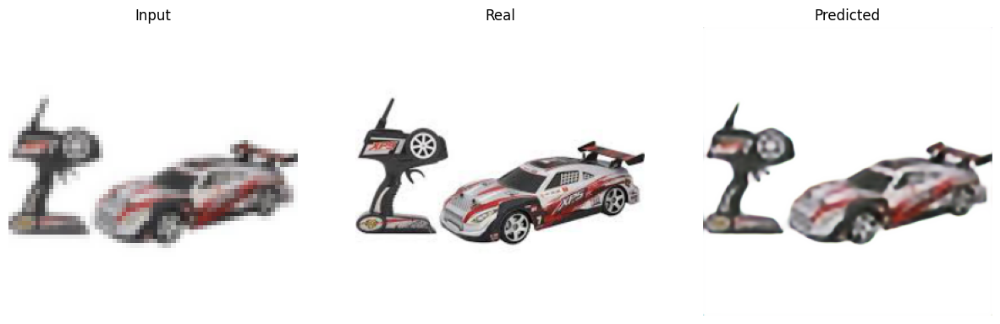

-----------------------------------------------------------
| End of epoch  17 | Time: 52.87s | Train psnr   24.450 | Train Loss    0.080 | Valid psnr   24.739 | Valid Loss    0.071 
-----------------------------------------------------------
| epoch  18 |    50/   86 batches | psnr   24.324


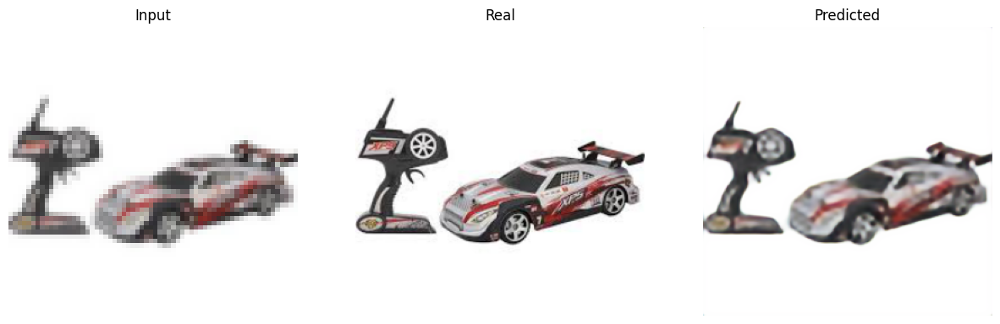

-----------------------------------------------------------
| End of epoch  18 | Time: 52.84s | Train psnr   24.349 | Train Loss    0.080 | Valid psnr   24.882 | Valid Loss    0.069 
-----------------------------------------------------------
| epoch  19 |    50/   86 batches | psnr   24.211
-----------------------------------------------------------
| End of epoch  19 | Time: 52.18s | Train psnr   24.350 | Train Loss    0.081 | Valid psnr   24.771 | Valid Loss    0.072 
-----------------------------------------------------------
| epoch  20 |    50/   86 batches | psnr   24.337
-----------------------------------------------------------
| End of epoch  20 | Time: 52.06s | Train psnr   23.612 | Train Loss    0.084 | Valid psnr   24.341 | Valid Loss    0.077 
-----------------------------------------------------------
| epoch  21 |    50/   86 batches | psnr   24.135
-----------------------------------------------------------
| End of epoch  21 | Time: 52.09s | Train psnr   23.940 | Tra

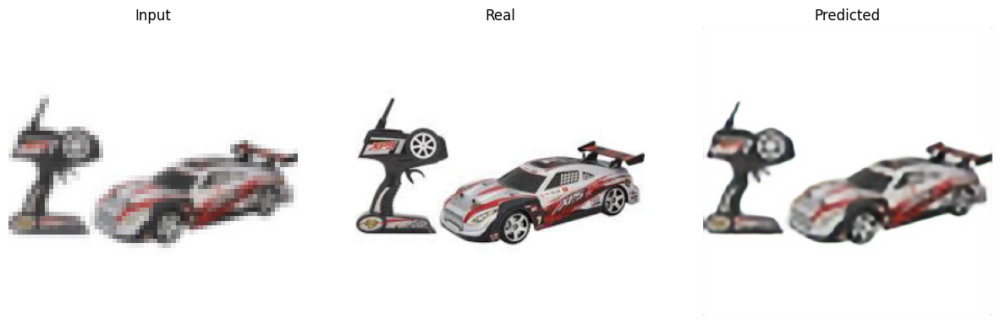

-----------------------------------------------------------
| End of epoch  22 | Time: 52.97s | Train psnr   24.454 | Train Loss    0.080 | Valid psnr   24.920 | Valid Loss    0.069 
-----------------------------------------------------------
| epoch  23 |    50/   86 batches | psnr   24.505
-----------------------------------------------------------
| End of epoch  23 | Time: 52.11s | Train psnr   24.581 | Train Loss    0.078 | Valid psnr   24.867 | Valid Loss    0.070 
-----------------------------------------------------------
| epoch  24 |    50/   86 batches | psnr   24.567
-----------------------------------------------------------
| End of epoch  24 | Time: 52.04s | Train psnr   24.384 | Train Loss    0.078 | Valid psnr   24.901 | Valid Loss    0.070 
-----------------------------------------------------------
| epoch  25 |    50/   86 batches | psnr   24.559
-----------------------------------------------------------
| End of epoch  25 | Time: 52.12s | Train psnr   24.679 | Tra

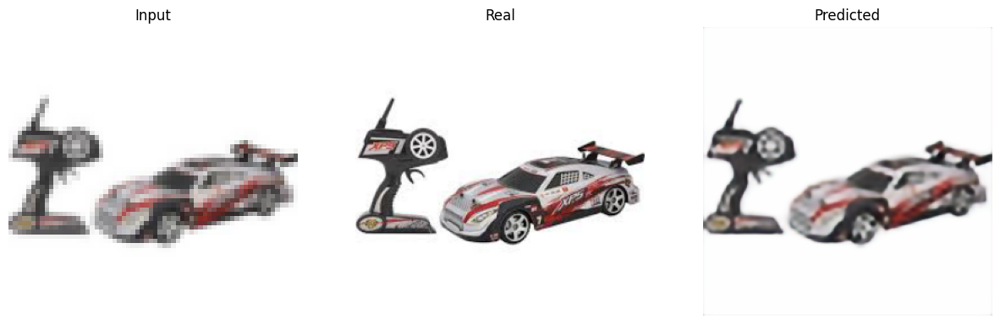

-----------------------------------------------------------
| End of epoch  27 | Time: 52.86s | Train psnr   24.368 | Train Loss    0.077 | Valid psnr   25.018 | Valid Loss    0.068 
-----------------------------------------------------------
| epoch  28 |    50/   86 batches | psnr   24.682
-----------------------------------------------------------
| End of epoch  28 | Time: 52.25s | Train psnr   24.736 | Train Loss    0.075 | Valid psnr   24.856 | Valid Loss    0.071 
-----------------------------------------------------------
| epoch  29 |    50/   86 batches | psnr   24.637
-----------------------------------------------------------
| End of epoch  29 | Time: 52.11s | Train psnr   24.637 | Train Loss    0.075 | Valid psnr   24.831 | Valid Loss    0.073 
-----------------------------------------------------------
| epoch  30 |    50/   86 batches | psnr   24.571
-----------------------------------------------------------
| End of epoch  30 | Time: 52.09s | Train psnr   24.826 | Tra

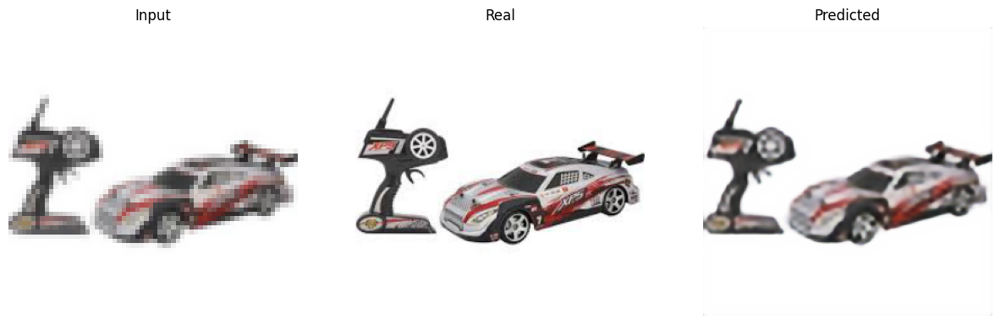

-----------------------------------------------------------
| End of epoch  31 | Time: 52.85s | Train psnr   24.434 | Train Loss    0.077 | Valid psnr   25.044 | Valid Loss    0.068 
-----------------------------------------------------------
| epoch  32 |    50/   86 batches | psnr   24.626


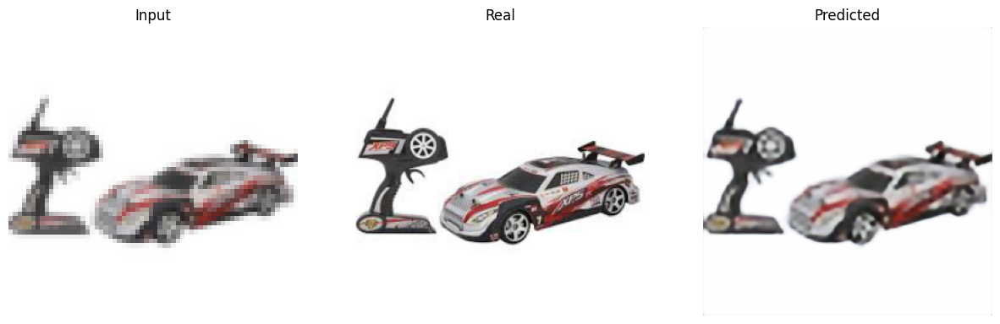

-----------------------------------------------------------
| End of epoch  32 | Time: 52.91s | Train psnr   24.734 | Train Loss    0.076 | Valid psnr   25.090 | Valid Loss    0.067 
-----------------------------------------------------------
| epoch  33 |    50/   86 batches | psnr   24.680
-----------------------------------------------------------
| End of epoch  33 | Time: 52.32s | Train psnr   24.956 | Train Loss    0.074 | Valid psnr   24.789 | Valid Loss    0.070 
-----------------------------------------------------------
| epoch  34 |    50/   86 batches | psnr   24.813
-----------------------------------------------------------
| End of epoch  34 | Time: 52.49s | Train psnr   24.917 | Train Loss    0.073 | Valid psnr   25.062 | Valid Loss    0.070 
-----------------------------------------------------------
| epoch  35 |    50/   86 batches | psnr   24.938
-----------------------------------------------------------
| End of epoch  35 | Time: 52.00s | Train psnr   24.636 | Tra

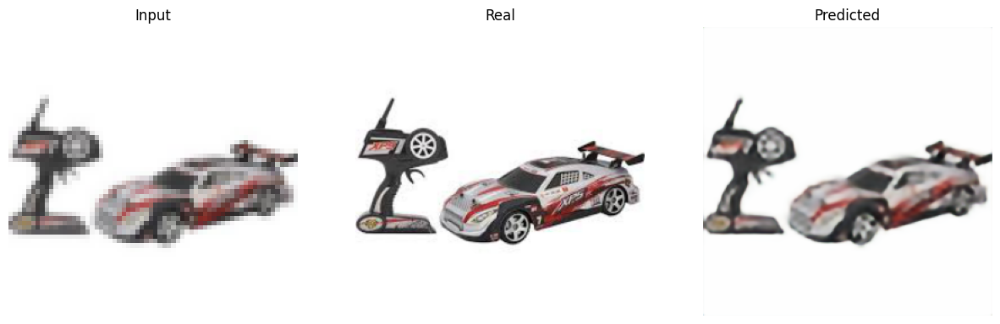

-----------------------------------------------------------
| End of epoch  36 | Time: 52.99s | Train psnr   24.919 | Train Loss    0.075 | Valid psnr   25.154 | Valid Loss    0.066 
-----------------------------------------------------------
| epoch  37 |    50/   86 batches | psnr   24.729
-----------------------------------------------------------
| End of epoch  37 | Time: 52.06s | Train psnr   24.904 | Train Loss    0.074 | Valid psnr   24.853 | Valid Loss    0.071 
-----------------------------------------------------------
| epoch  38 |    50/   86 batches | psnr   24.926


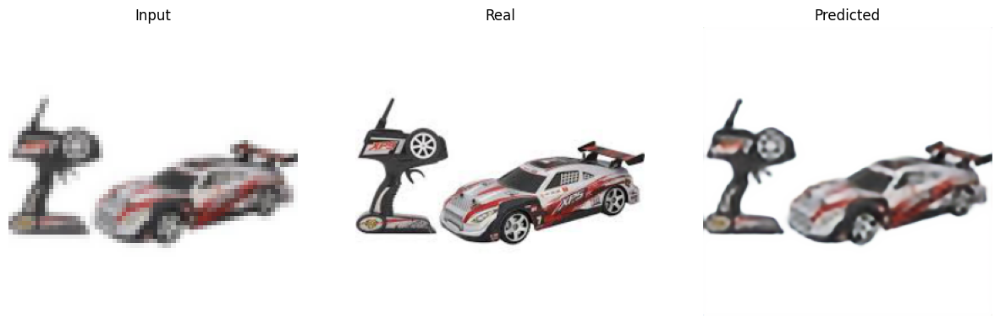

-----------------------------------------------------------
| End of epoch  38 | Time: 52.87s | Train psnr   24.954 | Train Loss    0.072 | Valid psnr   25.185 | Valid Loss    0.065 
-----------------------------------------------------------
| epoch  39 |    50/   86 batches | psnr   24.840
-----------------------------------------------------------
| End of epoch  39 | Time: 52.15s | Train psnr   24.736 | Train Loss    0.074 | Valid psnr   24.810 | Valid Loss    0.074 
-----------------------------------------------------------
| epoch  40 |    50/   86 batches | psnr   25.038
-----------------------------------------------------------
| End of epoch  40 | Time: 52.09s | Train psnr   24.427 | Train Loss    0.074 | Valid psnr   25.050 | Valid Loss    0.069 
-----------------------------------------------------------
| epoch  41 |    50/   86 batches | psnr   24.798
-----------------------------------------------------------
| End of epoch  41 | Time: 52.01s | Train psnr   24.824 | Tra

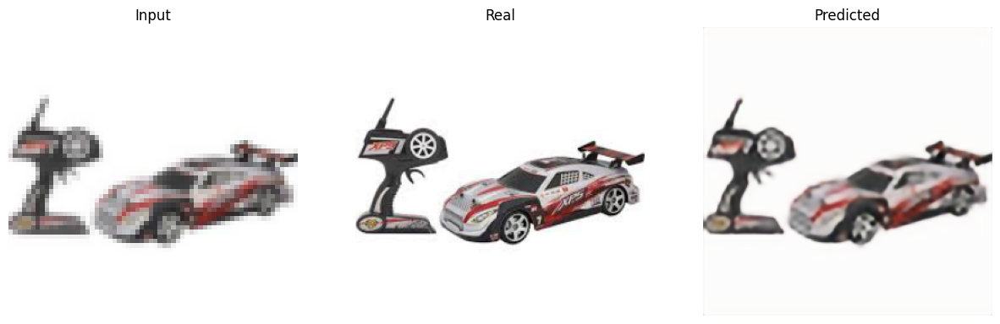

-----------------------------------------------------------
| End of epoch  42 | Time: 52.88s | Train psnr   24.612 | Train Loss    0.072 | Valid psnr   25.225 | Valid Loss    0.067 
-----------------------------------------------------------
| epoch  43 |    50/   86 batches | psnr   25.110
-----------------------------------------------------------
| End of epoch  43 | Time: 52.06s | Train psnr   24.775 | Train Loss    0.072 | Valid psnr   25.219 | Valid Loss    0.066 
-----------------------------------------------------------
| epoch  44 |    50/   86 batches | psnr   24.961
-----------------------------------------------------------
| End of epoch  44 | Time: 52.06s | Train psnr   24.769 | Train Loss    0.073 | Valid psnr   25.114 | Valid Loss    0.068 
-----------------------------------------------------------
| epoch  45 |    50/   86 batches | psnr   24.997


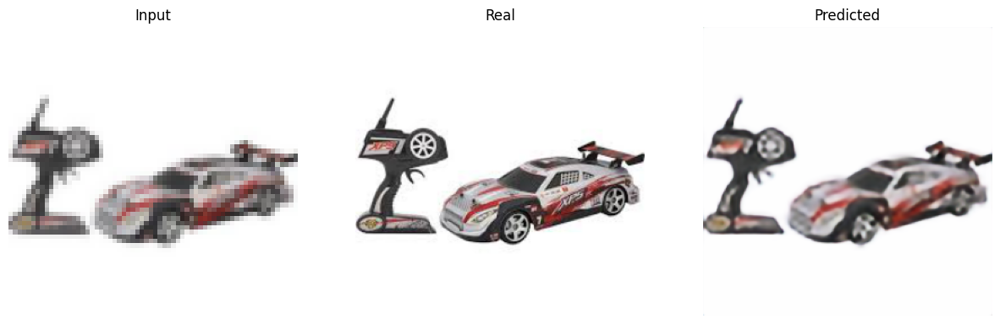

-----------------------------------------------------------
| End of epoch  45 | Time: 52.80s | Train psnr   25.024 | Train Loss    0.071 | Valid psnr   25.243 | Valid Loss    0.065 
-----------------------------------------------------------
| epoch  46 |    50/   86 batches | psnr   24.950
-----------------------------------------------------------
| End of epoch  46 | Time: 52.06s | Train psnr   25.234 | Train Loss    0.070 | Valid psnr   25.209 | Valid Loss    0.066 
-----------------------------------------------------------
| epoch  47 |    50/   86 batches | psnr   24.952
-----------------------------------------------------------
| End of epoch  47 | Time: 52.14s | Train psnr   24.813 | Train Loss    0.073 | Valid psnr   24.931 | Valid Loss    0.073 
-----------------------------------------------------------
| epoch  48 |    50/   86 batches | psnr   25.076
-----------------------------------------------------------
| End of epoch  48 | Time: 52.04s | Train psnr   24.921 | Tra

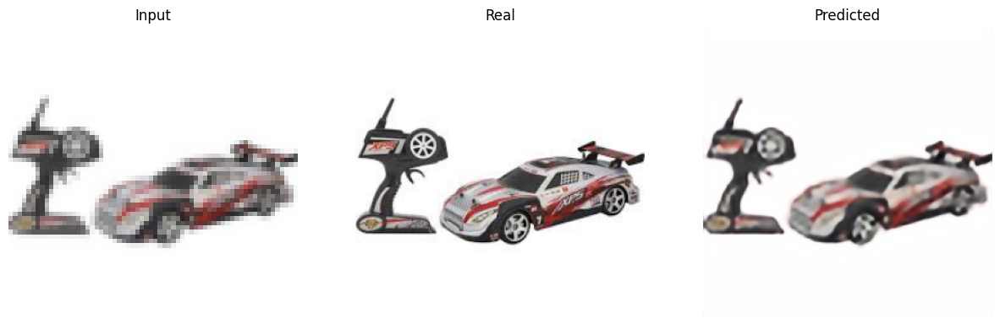

-----------------------------------------------------------
| End of epoch  57 | Time: 52.99s | Train psnr   25.042 | Train Loss    0.069 | Valid psnr   25.279 | Valid Loss    0.066 
-----------------------------------------------------------
| epoch  58 |    50/   86 batches | psnr   25.079
-----------------------------------------------------------
| End of epoch  58 | Time: 52.08s | Train psnr   25.277 | Train Loss    0.069 | Valid psnr   25.191 | Valid Loss    0.068 
-----------------------------------------------------------
| epoch  59 |    50/   86 batches | psnr   25.046


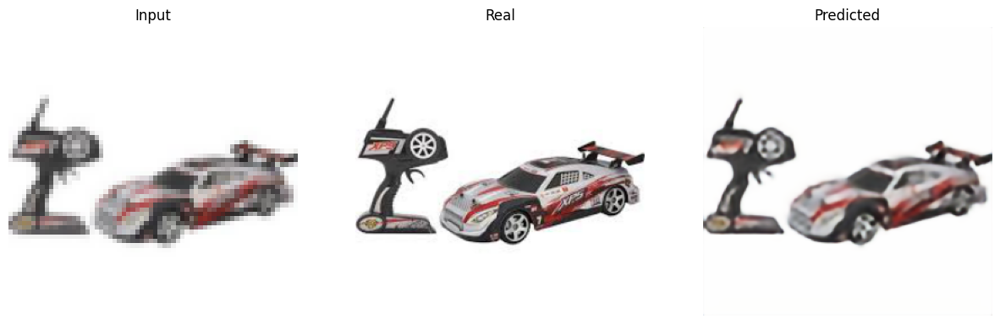

-----------------------------------------------------------
| End of epoch  59 | Time: 52.92s | Train psnr   25.231 | Train Loss    0.070 | Valid psnr   25.385 | Valid Loss    0.064 
-----------------------------------------------------------
| epoch  60 |    50/   86 batches | psnr   25.165


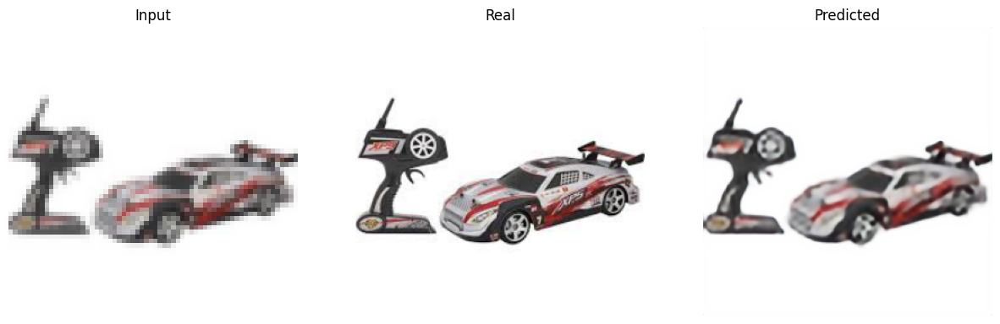

-----------------------------------------------------------
| End of epoch  60 | Time: 52.80s | Train psnr   25.307 | Train Loss    0.068 | Valid psnr   25.432 | Valid Loss    0.062 
-----------------------------------------------------------
| epoch  61 |    50/   86 batches | psnr   25.253
-----------------------------------------------------------
| End of epoch  61 | Time: 52.14s | Train psnr   25.112 | Train Loss    0.069 | Valid psnr   25.388 | Valid Loss    0.064 
-----------------------------------------------------------
| epoch  62 |    50/   86 batches | psnr   25.361
-----------------------------------------------------------
| End of epoch  62 | Time: 52.10s | Train psnr   25.131 | Train Loss    0.068 | Valid psnr   25.345 | Valid Loss    0.064 
-----------------------------------------------------------
| epoch  63 |    50/   86 batches | psnr   25.250
-----------------------------------------------------------
| End of epoch  63 | Time: 52.00s | Train psnr   25.221 | Tra

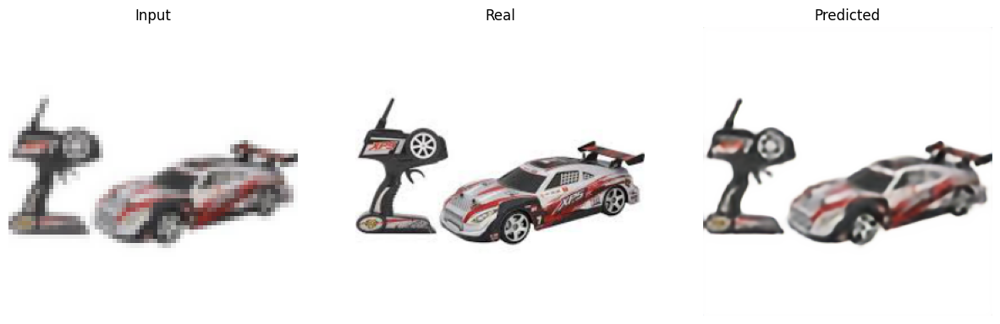

-----------------------------------------------------------
| End of epoch  79 | Time: 52.89s | Train psnr   25.345 | Train Loss    0.067 | Valid psnr   25.457 | Valid Loss    0.064 
-----------------------------------------------------------
| epoch  80 |    50/   86 batches | psnr   25.243
-----------------------------------------------------------
| End of epoch  80 | Time: 52.08s | Train psnr   25.666 | Train Loss    0.066 | Valid psnr   25.442 | Valid Loss    0.064 
-----------------------------------------------------------
| epoch  81 |    50/   86 batches | psnr   25.298
-----------------------------------------------------------
| End of epoch  81 | Time: 52.06s | Train psnr   25.419 | Train Loss    0.067 | Valid psnr   25.392 | Valid Loss    0.066 
-----------------------------------------------------------
| epoch  82 |    50/   86 batches | psnr   25.418
-----------------------------------------------------------
| End of epoch  82 | Time: 52.07s | Train psnr   25.357 | Tra

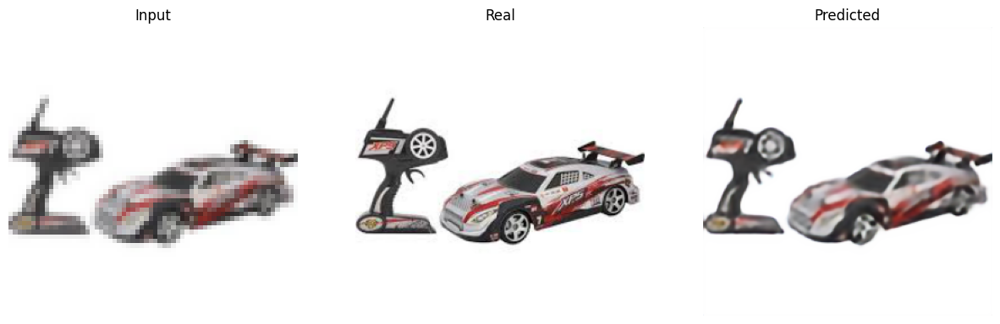

-----------------------------------------------------------
| End of epoch  86 | Time: 52.80s | Train psnr   25.339 | Train Loss    0.065 | Valid psnr   25.516 | Valid Loss    0.063 
-----------------------------------------------------------
| epoch  87 |    50/   86 batches | psnr   25.434
-----------------------------------------------------------
| End of epoch  87 | Time: 52.20s | Train psnr   25.521 | Train Loss    0.066 | Valid psnr   25.483 | Valid Loss    0.064 
-----------------------------------------------------------
| epoch  88 |    50/   86 batches | psnr   25.415
-----------------------------------------------------------
| End of epoch  88 | Time: 52.09s | Train psnr   25.767 | Train Loss    0.064 | Valid psnr   25.504 | Valid Loss    0.063 
-----------------------------------------------------------
| epoch  89 |    50/   86 batches | psnr   25.316
-----------------------------------------------------------
| End of epoch  89 | Time: 51.89s | Train psnr   25.741 | Tra

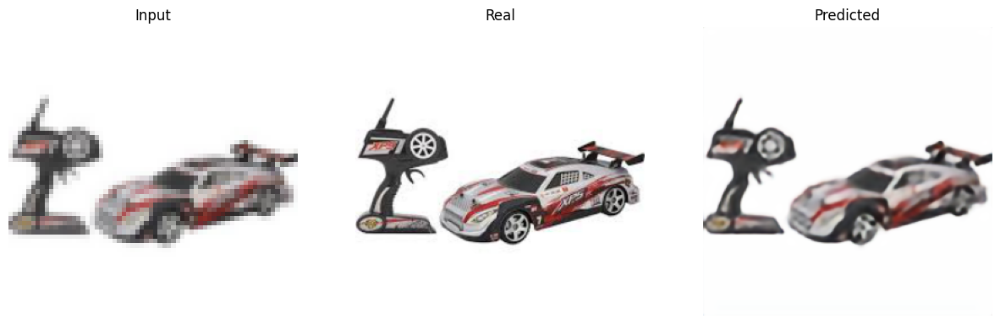

-----------------------------------------------------------
| End of epoch  93 | Time: 52.89s | Train psnr   25.727 | Train Loss    0.066 | Valid psnr   25.534 | Valid Loss    0.063 
-----------------------------------------------------------
| epoch  94 |    50/   86 batches | psnr   25.710
-----------------------------------------------------------
| End of epoch  94 | Time: 52.10s | Train psnr   25.273 | Train Loss    0.065 | Valid psnr   25.454 | Valid Loss    0.066 
-----------------------------------------------------------
| epoch  95 |    50/   86 batches | psnr   25.443
-----------------------------------------------------------
| End of epoch  95 | Time: 52.02s | Train psnr   25.526 | Train Loss    0.066 | Valid psnr   25.520 | Valid Loss    0.064 
-----------------------------------------------------------
| epoch  96 |    50/   86 batches | psnr   25.570
-----------------------------------------------------------
| End of epoch  96 | Time: 52.16s | Train psnr   25.500 | Tra

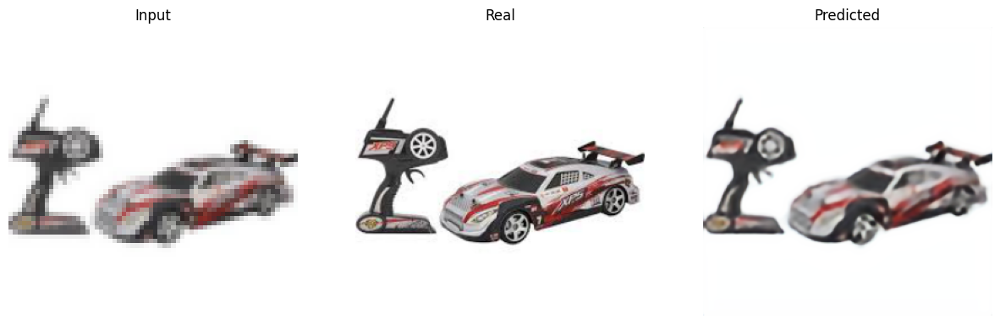

-----------------------------------------------------------
| End of epoch 100 | Time: 52.78s | Train psnr   25.690 | Train Loss    0.064 | Valid psnr   25.571 | Valid Loss    0.063 
-----------------------------------------------------------


<ipython-input-34-9140fde4fd84>:36: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model + f'/{model_name}.pt'))


In [ ]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
SR_unet_model = SR_Unet().to(device)
SR_unet_model.to(device)

criterion = nn.L1Loss()

optimizer = optim.Adam(SR_unet_model.parameters(), lr=1e-4, betas=[0.5,0.999])

save_model = './UNET'
os.makedirs(save_model, exist_ok = True)

EPOCHS = 100
SR_unet_model, metrics = train(
    SR_unet_model, 'SR_unet_model', save_model, optimizer, criterion, train_loader, test_loader, EPOCHS, device
)

In [ ]:
plot_result(
    EPOCHS,
    metrics["train_psnr"],
    metrics["valid_psnr"],
    metrics["train_loss"],
    metrics["valid_loss"]
)

NameError: name 'plot_result' is not defined

In [ ]:
test_psnr, test_loss = evaluate_epoch(SR_unet_model, criterion, test_loader, device)
test_psnr, test_loss

In [ ]:
predict_and_display(SR_unet_model, train_loader, device)

In [ ]:
predict_and_display(SR_unet_model, test_loader, device)